# Visión por Computador - Práctica 3 - Extracción (y Emparejamiento) de Características y Registrado de Imágenes

#### 12 puntos   |   Fecha de entrega: 1 de Enero de 2026, 23:59   |   Forma de entrega: a través de la tarea creada en https://pradogrado2526.ugr.es/

### Estudiante: <mark>Jaime Corzo Galdó</mark>



## Normas de desarrollo y entrega de la práctica

1. Para este trabajo, al igual que para los demás, se debe presentar código, resultados, discusión de los mismos, y presentación y análisis del trabajo realizado, todo integrado en el propio Google Colab Notebook (es decir, no se entrega ninguna memoria separada en `.pdf` ni ningún código `.py`). Se recuerda que código y resultados sin informe explicativo no puntúa. Resulta también fundamental recordar que solo se acepta la entrega de ficheros `.ipynb` (no resulta válido entregar un fichero `.py`).

2. En relación con el punto anterior, se recuerda que se proporciona un Notebook, denominado `Ejemplo_Otsu.ipynb`, que muestra un ejemplo de respuesta y solución a un potencial ejercicio. El propósito de este Notebook es servir de referencia al alumnado acerca de cómo responder los ejercicios planteados. Véase que, por ejemplo, en aras de diferenciar con facilidad enunciados y respuestas, estas últimas se presentan en otro color (azul, en ese caso).

3. El diseño de celdas del documento debe ser respetado. Es decir, no se puede modificar el orden de los ejercicios o alterar la estructura del Notebook, de forma que dificulte localizar los contenidos. Aunque sí se puede, por ejemplo, crear nuevas subsecciones dentro de las secciones ya existentes para estructurar y organizar con más claridad las respuestas, así como para incluir los experimentos extra que se deseen.

4. Tal y como se muestra en `Ejemplo_Otsu.ipynb`, no hay ningún problema en emplear técnicas de IA generativa (como ChatGPT o Gemini) para crear el código de los distintos ejercicios o para enriquecer el análisis y descripción del trabajo realizado (aunque, obvia decirlo, su uso no es obligatorio). Pero, en caso de usarse, sí se debe aclarar de qué modo se ha usado la IA, con qué objetivo, y se debe demostrar que se entiende perfectamente lo que se ha hecho.

5. Solo se entregará el fichero `.ipynb` (incorporando código, resultados, y explicación del trabajo realizado y los resultados obtenidos) y no se enviarán las imágenes empleadas. El path para la lectura de imágenes, o cualquier otro fichero de entrada, debe ser siempre “/content/drive/My Drive/images/nombre_fichero”.

6. El código deberá  presentarse adecuadamente comentado y con los resultados obtenidos en cada apartado, junto con la presentación del trabajo realizado y la discusión y análisis de los resultados obtenidos. Es importante reiterar que la entrega de código sin informe explicativo o valoraciones no puntúa. Por otro lado, el código debe ir comentado en comentarios en celdas de código, mientras que el análisis y discusión, tanto del trabajo realizado como de los resultados obtenidos, debe ir en celdas de texto.






### Materiales de Apoyo

En caso de que el alumnado tenga dudas sobre Python, OpenCV o el uso de Google Colab, se recuerda que en PRADO hay materiales de apoyo (https://pradogrado2526.ugr.es/mod/folder/view.php?id=95307):
-  Introducción a Python: https://pradogrado2526.ugr.es/pluginfile.php/243163/mod_folder/content/0/1.%20Introduccion%20a%20Python.pdf
- Introducción a NumPy, Matplotlib y Scikit-learn: https://pradogrado2526.ugr.es/pluginfile.php/243163/mod_folder/content/0/2.%20Introducción%20a%20Numpy%20Matplotlib%20y%20sklearn.pdf
- Notebook con toda la información anterior (y más cosas): https://pradogrado2526.ugr.es/pluginfile.php/243163/mod_folder/content/0/Guia_Python.ipynb
- Ejercicios y ejemplos de repaso: https://pradogrado2526.ugr.es/pluginfile.php/243163/mod_folder/content/0/3.%20Ejercicios%20y%20ejemplos%20de%20repaso.pdf
- Fundamentos de Python para lectura, visualización y manipulación de imágenes: https://pradogrado2526.ugr.es/pluginfile.php/243163/mod_folder/content/0/4.%20Fundamentos%20de%20Python%20para%20manipulacion%20de%20imagenes.pdf (y Notebook asociado: https://pradogrado2526.ugr.es/pluginfile.php/243163/mod_folder/content/0/Guia_fundamentos_imagenes.ipynb)
- Ideas sobre cómo redactar un documento académico-científico (útil para saber cómo documentar las respuestas a los ejercicios, el Notebook en su conjunto, y la memoria del proyecto final o de un TFG/TFM): https://pradogrado2526.ugr.es/pluginfile.php/243163/mod_folder/content/0/Algunas%20ideas%20sobre%20cómo%20elaborar%20un%20informe%20académico-científico.pdf
- Ejemplo de respuesta a un hipotético ejercicio sobre el algoritmo de umbralización de Otsu: https://pradogrado2526.ugr.es/pluginfile.php/243164/mod_folder/content/0/Ejemplo_Otsu.ipynb

<font color='blue'>En esta práctica aprenderás:

<font color='blue'>a) A detectar puntos de interés utilizando el detector de esquinas de Harris (Ejercicio 1).

<font color='blue'>b) A encontrar correspondencias entre los _keypoints_ (puntos de interés) de dos imágenes utilizando distintos descriptores (Ejercicio 2).

<font color='blue'>c) A componer un mosaico/panorama a partir de un conjunto de imágenes utilizando homografías (Ejercicio 3).

In [ ]:
# Let's start importing all background modules
# We start by getting access to the drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
import sys,os
# change directory
%cd '/content/drive/My Drive'
# Let's import the python module exercises.py  to have access to its functions and Classes
get_image = lambda route: os.path.join('/content/drive/MyDrive/images/', route)
get_imageSN = lambda route: os.path.join('/content/drive/MyDrive/panoramas/Small_1029_SierraNevada/', route)
from matplotlib import pyplot as plt
import cv2, numpy as np, math

Mounted at /content/drive
/content/drive/My Drive


In [ ]:
'''
This function receives a string with the filename of the image to read,
and a flag indicating if we want to read it in color/RGB (flagColor=1) or gray level (flagColor=0)

Example of use:
im1=readIm(get_image('apple.jpg'),0)

'''
def readIm(filename, flagColor=1):
  # cv2 reads BGR format
  im=cv2.imread(filename)
  # change to  RGB and return the image
  if(flagColor):
    return cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
  # change from BGR to grayscale instead if flag is 0
  return cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

In [ ]:
'''
This function receives an array of arbitrary real numbers (that could include even negative values),
and returns an 'image' in the range [0,1].
flag_GLOBAL allows the user to normalize the whole image (including all channels) or to normalize
each channel/band independently.
'''
def rangeDisplay01(im, flag_GLOBAL= True):
  im = im.astype(float)
  if flag_GLOBAL:
    im = (im - im.min())/(im.max() - im.min())
  else:
    # bands normalization
    for band in range(im.shape[2]):
      im[:, :, band] = (im[:, :, band] - im[:, :, band].min())/(im[:, :, band].max() - im[:, :, band].min())
      # Note: remember that, for plt.imshow with RGB data, the valid range is [0..1] for floats and [0..255] for integers.
  return im

In [ ]:
'''
This function displays a single image, including a title, using a magnification factor.

Example of use:
im1=readIm(get_image('apple.jpg'),0)
displayIm(im1,'Manzana',0.5)

'''
def displayIm(im, title='Result',factor= 2):
  # First normalize range
  max=np.max(im)
  min=np.min(im)
  if min<0 or max>255:
    im=rangeDisplay01(im,flag_GLOBAL=True)
  if len(im.shape) == 3:
    # im es tribanda
    plt.imshow(im, cmap='jet')
  else:
    # im es monobanda
    plt.imshow(im, cmap='gray')
  figure_size = plt.gcf().get_size_inches()
  plt.gcf().set_size_inches(factor * figure_size)
  plt.title(title)
  plt.xticks([]), plt.yticks([]) # eliminamos numeración
  plt.show()

In [ ]:
'''
This function displays multiple images (including a title and using a magnification factor)
of equal size. The input to the function is a list of images.

Example of use:
im1=readIm(get_image('apple.jpg'),1)
images = [im1,im1,im1]

displayMI_ES(images, title='Manzanas',factor=1)

'''
def displayMI_ES(vim, title='Result',factor=2):
  # We set the maximun number of images to concatenate by columns
  maxcolumns=3
  # number of images to display
  numberim=len(vim)
  # The simplest case, one row: the maximum number of columns is larger than the images to stack
  # This is, by default, we put together the images column-wise
  if len(vim) < maxcolumns:
    out=vim[0]
    for item in range(1,len(vim)):
      #displayIm(out,str(item),1)
      out=np.hstack((out,vim[item]))

  # Else, if maxcolumns is smaller or equal than the number of images to stack
  else:
    # We check if all rows and columns are going to be 'busy', or if otherwise we need an extra-row
    if np.mod(len(vim),maxcolumns)== 0:
      maxrows=numberim//maxcolumns
    else:
      maxrows=numberim//maxcolumns+1

    # we build up the first block-row
    out=vim[0]
    for item in range(1,maxcolumns):
      out=np.hstack((out,vim[item]))
    # We build up the rest of block-rows
    for block in range(1,maxrows):
      #print(block)
      row=vim[block*maxcolumns]
      for item in range(1,maxcolumns):
        # We still have images to stack
        if block*maxcolumns+item < numberim:
          row=np.hstack((row,vim[block*maxcolumns+item]))
        # We do not have more images, and we have to fill with black
        else:
          row=np.hstack((row,np.zeros(vim[0].shape,dtype=vim[0].dtype)))
          #print(row.dtype)
          # if we don't include ',dtype=vim[0].dtype', np.zeros will include float
          # numbers in the matrix. This will make that the whole matrix will be
          # considered as floats, and values larger than 1 will be clipped to 1,
          # displaying an almost totally white image
      # add the new block-row
      out=np.vstack((out,row))
  return displayIm(out,title,factor)

In [ ]:
# AQUI SE INCLUYEN LAS FUNCIONES NECESARIAS DE LA PRACTICA 1

# A CUBRIR POR EL ALUMNADO
def GaussFunc(x,sigma):
    return np.exp(-(x**2)/(2.0*sigma**2)) #A CUBRIR POR EL ALUMNADO

def GaussDeriv1Func(x,sigma):
    return np.exp(-(x**2)/(2.0*sigma**2))*(-x/sigma**2) #A CUBRIR POR EL ALUMNADO

def GaussDeriv2Func(x,sigma):
    #return np.exp(-(x**2)/(2.0*sigma**2))*(-x/sigma**2)*(-x/sigma**2) + np.exp(-(x**2)/(2.0*sigma**2))*(-1/sigma**2)#A CUBRIR POR EL ALUMNADO
    return np.exp(-(x**2)/(2.0*sigma**2))*((x**2/sigma**4) + (-1/sigma**2))

def gaussianMask1D(sigma=0, sizeMask=0, order=0):
    # order = 0 -> función Gaussiana
    # order = 1 -> derivada de la Gaussiana
    # order = 2 -> derivada segunda de la Gaussiana

    #A CUBRIR POR EL ALUMNADO
    if sigma > 0:
      k = int(math.ceil(3.0*float(sigma) - 0.5))
      T = 2*k + 1
    else:
      sigma = (sizeMask-1)/6
      k = (sizeMask-1)/2

    x = np.arange(-k, k + 1, dtype=np.float64)

    if order==0:
      mask = GaussFunc(x, sigma)
      mask = mask/np.sum(mask)
    elif order==1:
      mask=GaussDeriv1Func(x,sigma)
      mask = mask*sigma
    elif order==2:
      mask=GaussDeriv2Func(x,sigma)
      mask = mask*(sigma**2)
    else:
      raise ValueError("order must be 0, 1, or 2")

    return mask

def my2DConv(im, sigma, orders):
  #A CUBRIR POR EL ALUMNADO
  maskG = gaussianMask1D(sigma=sigma, sizeMask=0, order=0)
  maskGx = gaussianMask1D(sigma=sigma, sizeMask=0, order=1)
  maskGxx = gaussianMask1D(sigma=sigma, sizeMask=0, order=2)
  if orders==[0,0]: # Suavizado Gaussiano
    return cv2.sepFilter2D(im,cv2.CV_64F,maskG,maskG) #A CUBRIR POR EL ALUMNADO
  elif orders==[1,0]: #A CUBRIR POR EL ALUMNADO
    return cv2.sepFilter2D(im,cv2.CV_64F,maskGx,maskG)
  elif orders==[0,1]: #A CUBRIR POR EL ALUMNADO
    return cv2.sepFilter2D(im,cv2.CV_64F,maskG,maskGx)
  elif orders==[2,0]: #A CUBRIR POR EL ALUMNADO
    return cv2.sepFilter2D(im,cv2.CV_64F,maskGxx,maskG)
  elif orders==[0,2]: #A CUBRIR POR EL ALUMNADO
    return cv2.sepFilter2D(im,cv2.CV_64F,maskG,maskGxx)
  else:
    print('Error en el orden de la derivada')

# <font color='blue'>**Ejercicio 1:** Harris Corner Detector (4 puntos)

Implementar la detección de los 475-525 puntos Harris más fuertes en una imagen (es decir, como mínimo, se deben detectar/mostrar 475 puntos de interés y como máximo 525). Los pasos para implementar el detector de esquinas de Harris son los siguientes:

> a) Fijar las escalas de diferenciación ($\sigma_D$) e integración ($\sigma_I$) en $3.0$ y $2.0$, respectivamente.

> b) Calcular las derivadas de la imagen. Para ello, se valorará positivamente el emplear las funciones creadas por el propio alumnado (en lugar de emplear directamente `cv2.getDerivKernels()`, `cv2.GaussianBlur()`, `cv2.filter2D()` y similares).

> c) Calcular los tres términos de la _Second Moment Matrix_ ($SMM$) en cada píxel. Para ello, aplicar convolución con una máscara gaussiana con $\sigma_I$.

> d) A partir de la $SMM$, calcular el valor de Harris en cada píxel de la imagen.

> e) Aplique la supresión de no máximos mediante la función `corner_peaks()` (https://scikit-image.org/docs/stable/api/skimage.feature.html#skimage.feature.corner_peaks) del módulo `skimage.features`. El alumnado debe seleccionar una `min_distance` adecuada (`The minimal allowed distance separating peaks`) y un umbral de respuesta adecuado en el mapa de Harris para mantener solo la cantidad de _keypoints_ que se solicitan en el enunciado. El resultado será una lista de coordenadas $(x,y)$. Extraiga los valores en estas coordenadas y cree una lista de vectores $(x,y,value)$.

> f) Calcule la orientación principal para cada punto. Para ello, primero suavizamos ambas imágenes derivadas con $\sigma=2$ y, a continuación, calculamos la orientación del gradiente en esos puntos.

> g) Cree una lista de _keypoints_ usando los puntos seleccionados. Un _keypoint_ suele representarse como un vector que incluye distintos elementos, por ejemplo, $(x,y,scale,orientation)$. En nuestro caso, un _keypoint_ es una estructura de OpenCV (`cv2.KeyPoint`), asociada a cada región detectada, que contendrá las coordenadas $x$ e $y$ del _keypoint_, así como su tamaño ($size$, es decir, el diámetro con el que se va a mostrar) y su orientacion ($angle$, calculada en el paso anterior). El parámetro $size$ de _KeyPoint()_, es decir, el diámetro del _keypoint_ mostrado, debe ser suficientemente grande como para ser visualizado adecuadamente. Una posibilidad es emplear `size=4*np.floor(3*sigmaI)+1`

> h) Dibuje los puntos sobre la imagen de entrada usando la función `drawKeyPoints()` (https://docs.opencv.org/4.x/d4/d5d/group__features2d__draw.html#ga5d2bafe8c1c45289bc3403a40fb88920), y los _flags_ `cv2.DRAW_MATCHES_FLAGS_DRAW_OVER_OUTIMG+cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS`.

Se deben calcular los puntos de Harris sobre la imagen `Luxemburg_ArcelorMittal_1.JPG`, y se debe mostrar:
* El mapa de respuestas de Harris (valor de Harris) en cada píxel de la imagen,
* el mapa de Harris umbralizado, es decir, una vez aplicado supresión de no máximos y un umbral mínimo de respuesta adecuado para obtener el número de puntos de interés solicitados,
* y la imagen de entrada con los keypoints finales, junto con el número exacto de _keypoints_ detectados (es decir, es necesario hacer un `print()` con el número de puntos de Harris). Para seleccionar el número de esquinas solicitado en el enunciado, el alumnado debe "jugar" con los valores de `min_distance` (en `corner_peaks()`) y el `threshold` que se use sobre las respuestas de Harris. Ambos parámetros se pasan como entrada a la función `NonMaximaSuppression(harrisMap, min_distance, threshold)`, como se ve más abajo.





<font color='blue'>Empezamos calculando la matriz de Harris. La idea de este método es usar la derivadas de la imagen para encontrar las esquinas, que van a ser los puntos de interés. Esto es así porque las esquinas, a diferencia de los bordes y de los puntos interiores(conjunto de puntos con valor constante), cuando pones una ventana sobre la esquina y la mueves, la imagen cambia, algo que no pasa con los puntos interiores y con los bordes si te mueves en la dirección del borde, y queremos que cambien en todas las direcciones.

<font color='blue'>por ello definimos el error $E(u,v)$, que dada una ventana W, consideramos la suma de diferencias al cuadrado de las intesidades de los pixeles de la ventana original y la ventana tras desplazarse u pixeles horizontalmente y v pixeles verticalmente.

<font color='blue'>
\begin{equation}
E(u,v) = \sum_{(x,y)\in{W}}{[I(x+u,y+u)-I(x,y)]^2}
\end{equation}

<font color='blue'>Queremos que el error sea alto para todas las posibles direcciones $(u,v)$, sin embargo, esto es costoso de calcular. Por ello usamos la serie de Taylor para hacer una aproximación y va a ser sufieciente quedarnos con la aproximación de primer orden.

<font color='blue'>
\begin{equation}
I(x+u,y+u) \approx I(x,y) + \frac{\partial I}{\partial x}u + \frac{\partial I}{\partial y}v
\end{equation}

<font color='blue'>
Luego nos queda que

<font color='blue'>
\begin{equation}
E(u,v) \approx \sum_{(x,y)\in{W}}{[I(x,y)+I_xu+I_yv-I(x,y)]^2} \approx \sum_{(x,y)\in{W}}{[I_xu+I_yv]^2} \approx Au^2 + 2Buv + Cv^2
\end{equation}

<font color='blue'>Donde:
\begin{equation}
A = \sum_{(x,y)\in{W}}{I_x^2}
\end{equation}
<font color='blue'>
\begin{equation}
B = \sum_{(x,y)\in{W}}{I_xI_y}
\end{equation}
<font color='blue'>
\begin{equation}
C = \sum_{(x,y)\in{W}}{I_y^2}
\end{equation}

<font color='blue'>En consecuencia, podemos aproximar localmente el error $E(u,v)$ como una función de error cuadrático. Además, esta cuación cuadrática se puede expresar en forma matricial donde la matriz es la Second Moment Matrix ( 𝑆𝑀𝑀 )
\begin{equation}
SMM = \begin{bmatrix}
A & B\\
B & C
\end{bmatrix}
\end{equation}

<font color='blue'>El siguiente paso es calcular los autovalores y autovectores, ya que podemos visualizar $E(u,v)$ como una elipse, donde el eje menor corresponde con la dirección(autovector) del cambio más rápido(autovalor) y el eje mayor con la del cambio más lento.

<font color='blue'>Para detectar una esquina tenemos que tener en cuenta que los autovalores $\lambda_1$ y $\lambda_2$ tienen que ser grandes y parecidos $\lambda_1 \approx \lambda_2$ y entonces " crece en todas las direcciones. Lo que se hace es definir una función escalar R a partir de $\lambda_1$ y $\lambda_2$, nosotrs hemos escogido

<font color='blue'>
\begin{equation}
R =  \frac{\lambda_1\lambda_2}{\lambda_1+\lambda_2} = \frac{det(H)}{traza(H)}
\end{equation}

<font color='blue'>Si umbralizamos R(nos quedamos con los valores grandes), podemos localizar esquinas, que vienen dadas por R grande y positivo.

In [ ]:
# Esta función calcula las derivadas en X e Y de una imagen.
def derivatives(im,sigmaD):
  # A CUBRIR POR EL ALUMNADO
  dx = my2DConv(im, sigmaD, [1, 0])
  dy = my2DConv(im, sigmaD, [0, 1])
  return dx,dy

# Esta función calcula el mapa de Harris.
# Recibe las derivadas en X e Y, junto con el sigmaI (escala de integración)
# Proporciona como salida una imagen del tamaño de la imagen de entrada, con el
# valor de cornerness (resultado de aplicar el método de Harris) en cada píxel.
def HarrisMap(dx,dy,sigmaI):
  # A CUBRIR POR EL ALUMNADO
  #Product/square of derivatives
  A = dx*dx
  B = dx*dy
  C = dy*dy

  #We convolve these 3 images with a Gaussian filter g(σI)
  #Each of the components of matrix H has the same size as
  #the input image. In other words, now each pixel in the
  #image will have three values associated with it.
  A = my2DConv(A, sigmaI, [0,0])
  B = my2DConv(B, sigmaI, [0,0])
  C = my2DConv(C, sigmaI, [0,0])

  #Compute scalar cornerness value using one of the R measures presented before
  det_H = (A*C)-(B*B)
  trace_H = A+C
  HMap = det_H/trace_H

  return HMap

<font color='blue'>Una vez hemos umbralizado R, en una esquina salen varios píxeles vecinos con respuesta alta ¿Cómo nos quedamos con el “píxel de esquina” y no con todo el manchón? Para ello usamosla supresión de no-máximos.

<font color='blue'>Procedimiento: Deslizar una ventana kxk por la imagen de respuestas R.
En cada ventana, si el píxel central es el máximo, se mantiene; si no, se descarta.
Así se quedan solo los máximos locales de R, que serán los puntos de interés finales.

<font color='blue'>Hemos usado la función *corner_peaks*, que identifica puntos de esquina a partir de un mapa de respuesta Harris (harrisMap) aplicando un umbral relativo (threshold_rel) y asegurando una distancia mínima (min_distance) entre las esquinas detectadas. Esto garantiza que los puntos detectados estén separados al menos min_distance píxeles, reduciendo la agrupación de detecciones.

In [ ]:
# Función que aplica supresión de no máximos al mapa de Harris obtenido
# tras aplicar HarrisMap().
from skimage.feature import corner_peaks

def NonMaximaSuppression(harrisMap, min_distance, threshold):
  # A CUBRIR POR EL ALUMNADO
  #Obtenemos las coordenadas de los picos
  coord = corner_peaks(harrisMap,
                       min_distance=min_distance,
                       threshold_rel=threshold)

  # Extraemos los valores en estas coordenadas
  values = harrisMap[coord[:,0], coord[:,1]]

  return coord, values

<font color='blue'>Por último tenemos que calcular la orientación en grados de los puntos detectados, para ello usamos el mismo procdimiento que el empleado en la práctica 1 para calcular la orientación del gradiente.

In [ ]:
# Esta función calcula la orientación del gradiente por píxel en grados.
def orientation(dx,dy):
  # A CUBRIR POR EL ALUMNADO
  #suavizamos ambas imágenes derivadas con  𝜎=2
  sigma_orient = 2.0
  dx_s = my2DConv(dx, sigma_orient, [0,0])
  dy_s = my2DConv(dy, sigma_orient, [0,0])

  #calculamos la orientación del gradiente en esos puntos.
  theta = np.arctan2(dy, dx) # orientación en radianes (-pi, pi]
  theta = (theta*180)/np.pi

  return theta

# Esta función crea la lista de keypoints a partir de localizaciones, orientaciones y escalas.
def keyPoints(coord,theta,size):
  keyPoints=[]
  for item in coord:
    reg=cv2.KeyPoint(item[1].astype(np.float32), item[0].astype(np.float32), size,
                     theta[item[0],item[1]])
    keyPoints.append(reg)
  return(keyPoints)


<font color='blue'>Ya nos queda usar todos los datos del problema y unirlo todo para obtener imagen sobre la que vamos a indicar los keypoints y los keypoints. Para mostrar la imagen final usamos la función cv2.drawKeypoints() en OpenCV que se utiliza para visualizar puntos clave detectados en una imagen dibujándolos como círculos u otros marcadores.

<font color='blue'>Toma como parámetros la imagen de entrada, una lista de keypoints y una imagen de salida, y devuelve una nueva imagen con los puntos clave dibujados.
La función no modifica la imagen original, sino que crea una nueva imagen con la visualización.

<font color='blue'>La sintaxis de la función es:
cv2.drawKeypoints(image, keypoints, outImage, color, flags).

<font color='blue'>image: la imagen original

<font color='blue'>keypoints: una lista de objetos cv2.KeyPoint, cada uno con atributos como posición (pt), tamaño, orientación (angle), respuesta, y ID de clase.

<font color='blue'>outImage: especifica la imagen de salida donde se dibujarán los keypoints; si es None, se crea una nueva imagen.

<font color='blue'>color: define el color de los puntos clave en formato RGB

<font color='blue'>flags: controla el estilo de dibujo; en nuestro caso nos piden usar

<font color='blue'>cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS: dibuja los puntos clave con círculos proporcionales a su escala e incluye una flecha indicando la orientación, proporcionando una visualización más completa.

<font color='blue'>cv2.DRAW_MATCHES_FLAGS_DRAW_OVER_OUTIMG: permite superponer líneas de coincidencia y puntos clave sobre una imagen ya existente, lo cual es especialmente útil para dibujar diferentes tipos de coincidencias (por ejemplo, inliers en verde y outliers en rojo) con distintos colores en la misma imagen de salida.

<font color='blue'>Además de mostrar la imagen de entrada con los keypoints finales hemos mostrado:

- <font color='blue'>el mapa de respuestas de Harris (valor de Harris) en cada píxel de la imagen. En esta imagen se muestra:
  - <font color='blue'>Zonas casi negras: valor de Harris cercano a 0 (regiones planas o bordes no muy fuertes).

  - <font color='blue'>Zonas claras (bordes brillantes, esquinas del edificio, ventanas, etc.): valor alto de Harris (candidatos a esquina).

- <font color='blue'>el mapa de Harris umbralizado, es decir, una vez aplicado supresión de no máximos y un umbral mínimo de respuesta adecuado para obtener el número de puntos de interés solicitados. En esta imagen lo que hacemos es inicializar todo a cero, y solo ponemos el valor de Harris en las coordenadas que han sobrevivido a:
  - <font color='blue'>el umbral(threshold_rel)
  - <font color='blue'>la supresión de no-máximos

  <font color='blue'>Como resultado obtenemos que casi todos los píxeles están a cero(negro) y un conjunto de píxeles sueltos(uno por esquina) están con un valor positivo, por eso la imagen se ve prácticamente negra.



---

<font color='blue'>*Evolución del número de keypoints*

<font color='blue'>Partimos de

- <font color='blue'>min_distance  = 5
- <font color='blue'>threshold_rel = 0.01

<font color='blue'>y obtenemos 3390 keypoints.

<font color='blue'>El threshold_rel especifica la intensidad relativa mínima de los picos, calculada como el valor máximo en la imagen de respuesta de la medida de esquinas multiplicado por threshold_rel.
Este valor debe estar entre 0 y 1. Con este parámetro se descartan respuesta débiles y aumentando su valor se obtienen menos puntos.

<font color='blue'>Por otro lado min_distance define la distancia mínima permitida entre los picos detectados, asegurando que no haya dos picos más cercanos entre sí que el número de píxeles especificado. Con este parámetro se evita tener esquinas muy juntas y aumnentando su valor se obtienen menos puntos.

<font color='blue'>Con

- <font color='blue'>min_distance  = 6
- <font color='blue'>threshold_rel = 0.1

<font color='blue'>obtenemos 881 keypoints.

<font color='blue'>Vemos que el cambio ha sido muy grande asi que ahora tenemos que hacer cambios más pequeños para quedarnos en el rango de 475-525 puntos Harris más fuertes.

<font color='blue'>Con

- <font color='blue'>min_distance  = 7
- <font color='blue'>threshold_rel = 0.2

<font color='blue'>obtenemos 345 keypoints. Luego nos hemos pasado.

<font color='blue'>Con

- <font color='blue'>min_distance  = 7
- <font color='blue'>threshold_rel = 0.15

<font color='blue'>obtenemos finalmente un número de 503 puntos de interés detectados en la imagen, que se encuentra practicamente en la mitad del rango especificado.



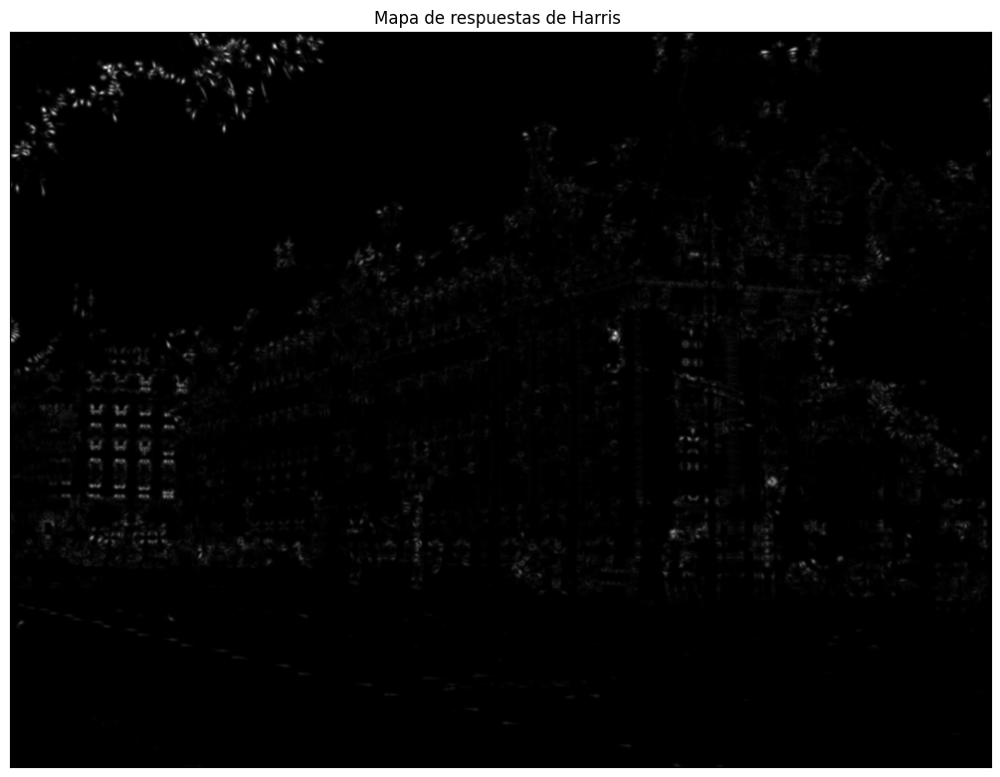

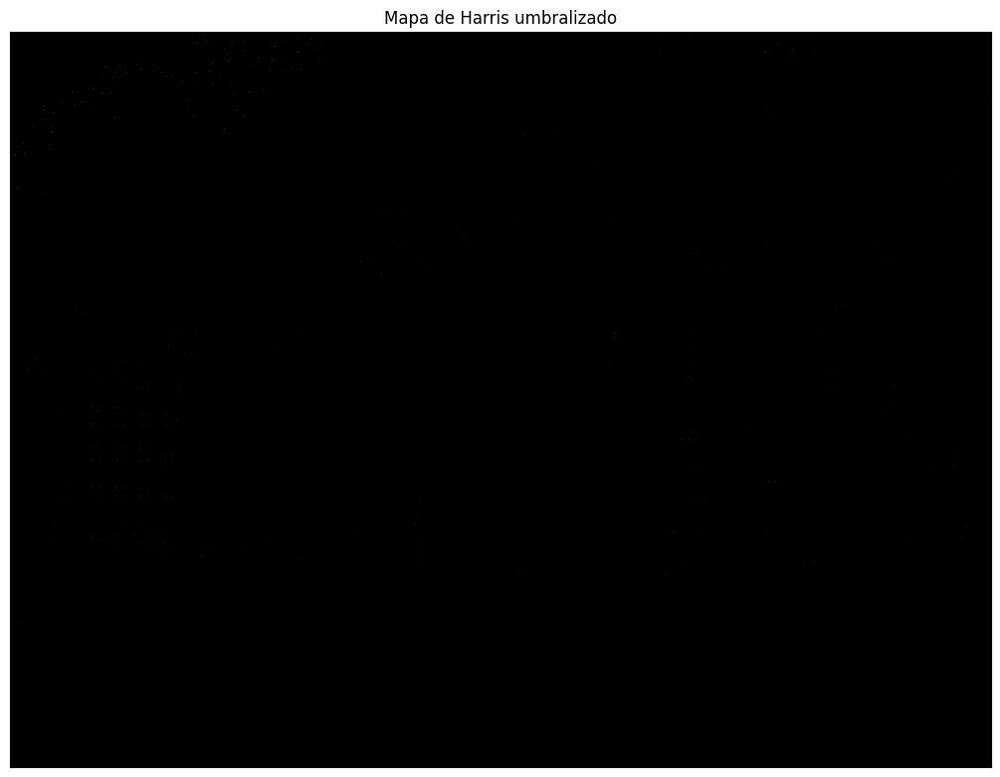

Number of detected keypoints:  503


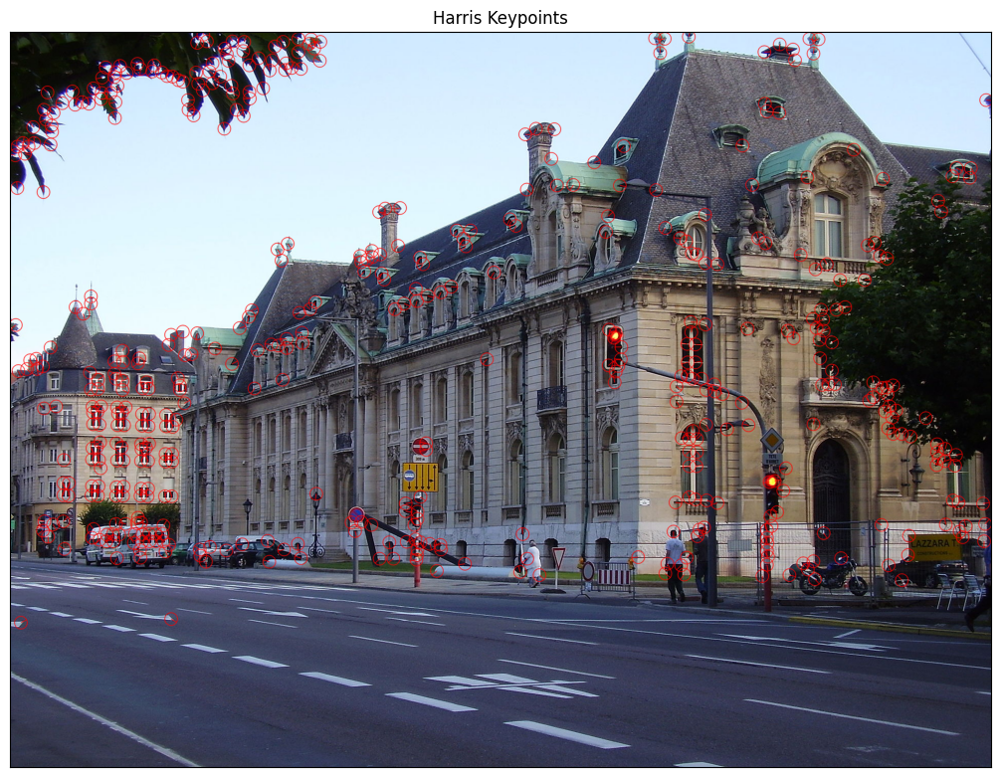

In [ ]:
sigmaD = 3.0   # escala de diferenciación
sigmaI = 2.0   # escala de integración

# Leemos la imagen de Luxemburgo en escala de grises (para el cálculo de Harris)
img_gray = readIm(get_image('Luxemburg_ArcelorMittal_1.JPG'), 0).astype(np.float64)

# 1) Cálculo de derivadas en X e Y
dx, dy = derivatives(img_gray, sigmaD)

# 2) Cálculo del mapa de respuestas de Harris
harrisMap = HarrisMap(dx, dy, sigmaI)

# Mostramos el mapa de Harris (antes de la supresión de no máximos )
displayIm(harrisMap, 'Mapa de respuestas de Harris ', 2)

# 3) Supresión de no máximos
min_distance  = 7       # distancia mínima entre esquinas
threshold_rel = 0.15    # umbral relativo respecto al máximo del mapa

coord, values = NonMaximaSuppression(harrisMap, min_distance, threshold_rel)

# mapa de Harris umbralizado, es decir, una vez aplicado supresión de no máximos
#y un umbral mínimo de respuesta adecuado para obtener el número de puntos de interés solicitados
harris_thresh = np.zeros_like(harrisMap)
harris_thresh[coord[:,0], coord[:,1]] = harrisMap[coord[:,0], coord[:,1]]

displayIm(harris_thresh, 'Mapa de Harris umbralizado', 2)

# 4) Cálculo de la orientación del gradiente en cada píxel
theta = orientation(dx, dy)

# 5) Creación de la lista de keypoints
size = 4 * np.floor(3 * sigmaI) + 1   # diámetro visual del keypoint

keypoints = keyPoints(coord, theta, size)

# 6) Dibujamos los keypoints sobre la imagen original en color
img_color = readIm(get_image('Luxemburg_ArcelorMittal_1.JPG'), 1)

print('Number of detected keypoints: ', len(keypoints))

img_kp = img_color.copy()
cv2.drawKeypoints(
    img_color,
    keypoints,
    img_kp,
    color=(255, 0, 0),
    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_OVER_OUTIMG +
          cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
)

displayIm(img_kp, 'Harris Keypoints', 2)

<font color='blue'>**Análisis de la imagen final**

---

<font color='blue'>Podemos ver que los puntos de interés efectivamente se encuentrar en las zonas con altas variaciones de intensidad, sobre todo en esquinas y bordes de las ventanas, en cornisas y cambios de la fachada, señales de tráfico, farolas y cohes y elementos como las hojas de los árboles.

<font color='blue'>En cambio, no aparecen keypoints en el cielo o en el asfalto liso. Esto confirma que el detector encuentra las esquinas verdaderas.

# <font color='blue'>**Ejercicio 2:** Emparejamiento de _keypoints_ entre imágenes usando descriptores SIFT, Haralick y _Deep Features_ (4 puntos)

En este apartado, partiendo de un detector de características (SIFT) y tres descriptores de características (SIFT, _Deep Features_ y Haralick), vamos a calcular el emparejamiento entre _keypoints_ de dos imágenes. Las imágenes con las que se trabajará en este ejercicio serán `IMG_20220312_102942_S.jpg` y `IMG_20220312_102946_S.jpg`. Estas imágenes son de $1200\times1600$ pero, tras leerlas, se debe reducir su tamaño a la mitad ($600\times800$). Es en esta última dimensionalidad en la que realizaremos todo el ejercicio y visualizaremos las imágenes. Y, a continuación, debemos pasarlas a escala de grises. Nota importante: del mismo modo que se calculan _keypoints_ y descriptores en escala de grises, luego los matches/emparejamientos sí se visualizan sobre las imágenes originales en color.

## SIFT (Scale-invariant feature transform)

En un primer momento, el alumnado debe aplicar el algoritmo SIFT a ambas imágenes para extraer los puntos de interés (_keypoints_) y los descriptores (https://docs.opencv.org/3.4/dc/dc3/tutorial_py_matcher.html). Luego, vamos a emplear tres criterios de emparejamiento: _brute force_ (`cv2.BFMatcher`), _brute force with cross-check_ (`cv2.BFMatcher` con `crossCheck=True`) y el _Lowe's ratio test_ (`knnMatch`) para calcular los emparejamientos y mostrar los $150$ mejores matches utilizando la función `cv2.drawMatches`.

En los siguientes apartados, emplearemos exactamente los mismos _keypoints_ detectados por SIFT para calcular otros descriptores en dichas localizaciones y comparar los resultados obtenidos. En los próximos apartados también se utilizarán y compararán los mismos tres criterios de emparejamiento indicados (_BF_, _BF+CC_ y _Lowe's ratio test_).

<font color='blue'>**Algoritmo SIFT (Scale Invariant Feature Transform)**

<font color='blue'>SIFT es un método para detectar puntos de interés (keypoints) y describirlos de forma robusta. El algoritmo se puede dividir en tres grandes etapas:

1. <font color='blue'>**Detección de keypoints en espacio de escala:**

    - <font color='blue'>*Construcción del espacio de escala gaussiano:*

        - <font color='blue'>Se genera una pirámide de imágenes suavizadas con filtros gaussianos de diferentes σ.

        - <font color='blue'>Las imágenes se organizan en octavas: en cada octava el σ se va incrementando y, al pasar a la siguiente octava, la imagen se submuestrea (se hace más pequeña) y se vuelve a repetir el proceso.

     - <font color='blue'>*Difference of Gaussians (DoG):*

        - <font color='blue'>En vez de usar directamente el Laplaciano de Gauss, se calculan imágenes DoG restando pares de imágenes gaussianas consecutivas.

        - <font color='blue'>El DoG es una buena aproximación del LoG y es más eficiente de calcular.

      - <font color='blue'>*Búsqueda de máximos/mínimos 3D*:

          - <font color='blue'>En el volumen DoG (x, y, escala), cada píxel se compara con sus 26 vecinos (8 en la misma escala, 9 en la escala anterior y 9 en la siguiente).

          - <font color='blue'>Si un píxel es máximo o mínimo local, se marca como posible keypoint.

      - <font color='blue'>*Refinamiento y filtrado de keypoints:*

          - <font color='blue'>Se ajusta la posición del extremo mediante una aproximación de Taylor de segundo orden, para lograr precisión sub-píxel y sub-escala.

          - <font color='blue'>Se descartan puntos de bajo contraste (valores DoG muy pequeños).

          - <font color='blue'>También se eliminan puntos que corresponden a bordes fuertes pero poco estables (analizando los autovalores del hessiano).

<font color='blue'>**Al final de esta etapa, cada keypoint tiene asociada una posición (x, y) y una escala característica.**

2. <font color='blue'>**Asignación de orientación:** Para lograr invariancia a la rotación, SIFT asigna una orientación dominante a cada keypoint:

    - <font color='blue'>Se toma una ventana alrededor del keypoint, usando la imagen a la escala correspondiente.

    - <font color='blue'>Para cada píxel de esa ventana se calcula el gradiente (magnitud y ángulo).

    - <font color='blue'>Se construye un histograma de orientaciones con 36 bins (10° por bin). Cada píxel aporta al histograma con peso igual a su magnitud de gradiente, multiplicada por una ventana gaussiana centrada en el keypoint (los píxeles del centro pesan más).

    - <font color='blue'>El pico principal del histograma se toma como orientación del keypoint. Si existen otros picos con altura ≥ 80% del máximo, se crean keypoints adicionales con esas orientaciones secundarias.

<font color='blue'>**Al terminar, cada keypoint queda definido por: (x, y, escala, orientación).**

3. <font color='blue'>**Cálculo del descriptor SIFT (128 dimensiones):** Una vez fijados posición, escala y orientación, se construye el descriptor:

    - <font color='blue'> Se toma una ventana 16x16 alrededor del keypoint, en la imagen de la escala adecuada, y se rota para que esté alineada con la orientación del keypoint (esto da invariancia a la rotación).

    - <font color='blue'>Esta ventana 16x16 se divide en una rejilla de 4x4 celdas, cada celda de 4x4 píxeles.

    - <font color='blue'>En cada celda se calcula un histograma de orientaciones con 8 bins (0-360°). De nuevo, cada píxel contribuye según la magnitud de su gradiente.

    - <font color='blue'>Se concatenan los histogramas de las 16 celdas: 4x4 celdas x 8 bins = 128 componentes -> descriptor SIFT.

    - <font color='blue'>Se normaliza el vector para hacerlo robusto a cambios de iluminación: primero se normaliza a norma 1, se recortan los valores mayores de un umbral (por ejemplo 0.2) para que gradientes muy fuertes no dominen, y se vuelve a normalizar.

4. <font color='blue'>**Propiedades del descriptor SIFT:**

  - <font color='blue'>Los keypoints son invariantes a: cambios de escala, rotaciones, traslaciones.
  
  - <font color='blue'>Los keypoints son bastante robustos frente a: cambios moderados de punto de vista, cambios de iluminación.

<font color='blue'>Por eso SIFT se utiliza como descriptor de referencia para tareas de matching, estimación de homografías, stitching de panoramas, etc., ya que permite emparejar puntos entre imágenes tomadas desde condiciones bastante diferentes.

<font color='blue'>Con *cv2.SIFT_create* podemos crear nuestro objeto sift limitando el número de keypoints a *nfeatures* y posteriormente con *sift.detectAndCompute(im, None)* detectamos los puntos claves y calculamos sus descriptores para la imagen im.

In [ ]:
# Esta función detecta keypoints y calcula sus descriptores empleando SIFT
def siftPoints(im,nfeatures=5000):
  # A CUBRIR POR EL ALUMNADO
  sift = cv2.SIFT_create(nfeatures)
  kp, ds = sift.detectAndCompute(im, None)

  return kp,ds

<font color='blue'>Una vez calculados los keypoints y sus descriptores, tenemos que realizar los matches entre las imágenes. Vamos a usar tres métodos.

- <font color='blue'>Fuerza bruta: Dado un descriptor de la primera imagen, nos quedamos con el descriptor de la segunda que minimize la distancia entre los dos descriptores. Puede dar pequeñas distancias para matches ambiguos(incorrectos). Para ello creamos el objeto matcher con crossCheck=False

- <font color='blue'>Fuerza Bruta con Cross Check: Ahora un match se considera válido si obtenemos el mismo par de keypoints en ambas direcciones, es decir, cada keypoint es el mejor match en ambas direcciones.

- <font color='blue'>Con distance ratio: Ahora consideramos el cociente entre las distancias del descriptor del keypoint de la primera imagen con los dos méjores matches de la segunda imagen. Cuanto más cercano a 1 sea este valor peor, lo que queremos es que sea lo más pequeño posible para asegurarnos que no hay ambiguedad en el match. Por ello Lowe estableció empíricamente un umbral entre 0.75-0.8, de tal manera que si quitamos los matches cuyo distance ratio sea mayor que este umbral eliminamos el 90% de los matches falsos perdidendo solo un 5% de los buenos.

<font color='blue'>Para implementarlo creamos el matcher con cv2.BFMatcher() y acepta dos parámetros opcionales:

- <font color='blue'>normType: Define el método de medición de distancia. Para descriptores de punto flotante como SIFT o SURF, se usa por defecto cv2.NORM_L2 (distancia Euclidiana). También se soporta cv2.NORM_L1 (distancia Manhattan).

- <font color='blue'> crossCheck: Booleano que, al ser True, asegura coincidencias mutuas, donde un descriptor del primer conjunto debe ser la mejor coincidencia para un descriptor del segundo conjunto, y viceversa.

<font color='blue'>Además tiene los siguientes métodos principales:

- <font color='blue'>BFMatcher.match(): Devuelve la mejor coincidencia única para cada descriptor. Lo usaremos tanto para Brute Force como BruteForce con CrossCheck.

- <font color='blue'>BFMatcher.knnMatch(): Devuelve las k mejores coincidencias. Lo usaremos knn con el ratio de Lowe quedandonos con las 2 mejores coincidencias.

In [ ]:
# Esta función sirve para mostrar los keypoints en la imagen
def showKP(im,kp,title):
  img_vis = im.copy()
  cv2.drawKeypoints( #reutilizamos la del ejercicio 1
      im,
      kp,
      img_vis,
      color=(255, 0, 0),
      flags=cv2.DRAW_MATCHES_FLAGS_DRAW_OVER_OUTIMG +
            cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
  )
  displayIm(img_vis,title,1)

# Esta función muestra los emparejamientos (matches) entre dos imágenes
def showMatches(im1,kp1,im2,kp2,matches, N, title='Matches'):
  # dibujamos como mucho N matches (o todos si hay menos)
  N = min(N, len(matches))
  imBF=cv2.drawMatches(
      img1 = im1,
      keypoints1 = kp1,
      img2 = im2,
      keypoints2 = kp2,
      matches1to2 = matches[:N],
      outImg = None,
      flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS

  )
  displayIm(imBF,title,2)

# Esta función calcula los emparejamientos (matches) entre los descriptores de dos imágenes
def matching(ds1,ds2,FlagMode='BF+CC'):
  if FlagMode=='BF':
    # Brute Force, sin cross-check
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
    matches = bf.match(ds1, ds2)
    matches = sorted(matches, key=lambda x: x.distance) #Para que luego se muestren los mejores

    return matches
  elif FlagMode=='BF+CC':
    # A CUBRIR POR EL ALUMNADO
    # Con cross-check
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    matches = bf.match(ds1, ds2)
    matches = sorted(matches, key=lambda x: x.distance) #Para que luego se muestren los mejores

    return matches
  elif FlagMode=='KNN':
    # A CUBRIR POR EL ALUMNADO
    # Lowe's ratio test con knnMatch
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
    knn = bf.knnMatch(ds1, ds2, k=2)  # mejor y segundo mejor
    matches = []
    ratio = 0.75
    for m, n in knn:
      if m.distance/n.distance < ratio:
        matches.append(m)
    matches = sorted(matches, key=lambda x: x.distance)

    return matches
  else:
    return print('Error in Matching mode')


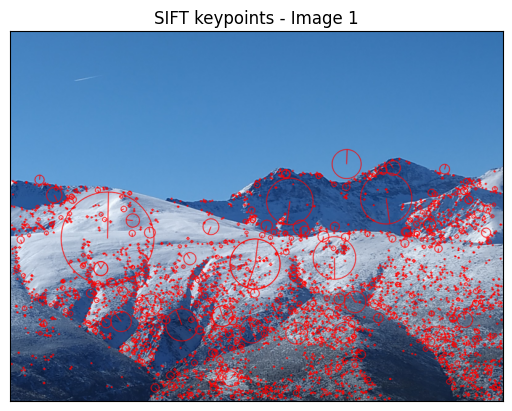

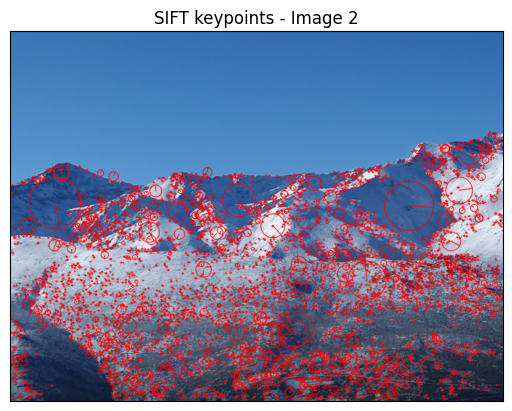

In [ ]:
img1=cv2.resize(readIm(get_image('IMG_20220312_102942_S.jpg'),1), (0,0), fx=0.5, fy=0.5) #
im1=cv2.cvtColor(img1,cv2.COLOR_RGB2GRAY)
img2=cv2.resize(readIm(get_image('IMG_20220312_102946_S.jpg'),1), (0,0), fx=0.5, fy=0.5) #
im2=cv2.cvtColor(img2,cv2.COLOR_RGB2GRAY)

# Detectamos keypoints y descriptores SIFT en escala de grises
kp1, ds1 = siftPoints(im1)
kp2, ds2 = siftPoints(im2)

# Visualizamos keypoints SIFT sobre las imágenes en color
showKP(img1, kp1, 'SIFT keypoints - Image 1')
showKP(img2, kp2, 'SIFT keypoints - Image 2')

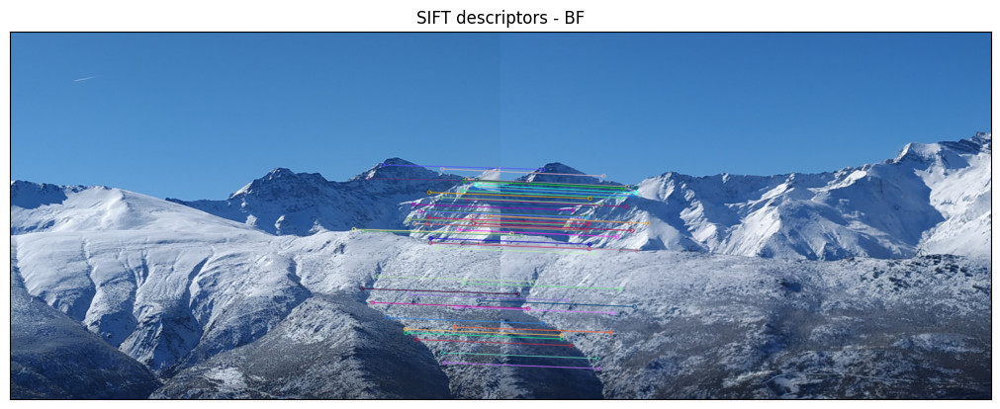

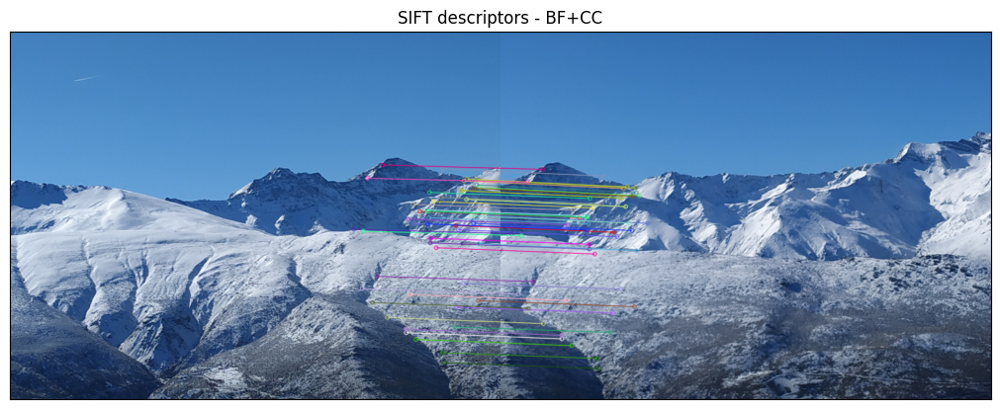

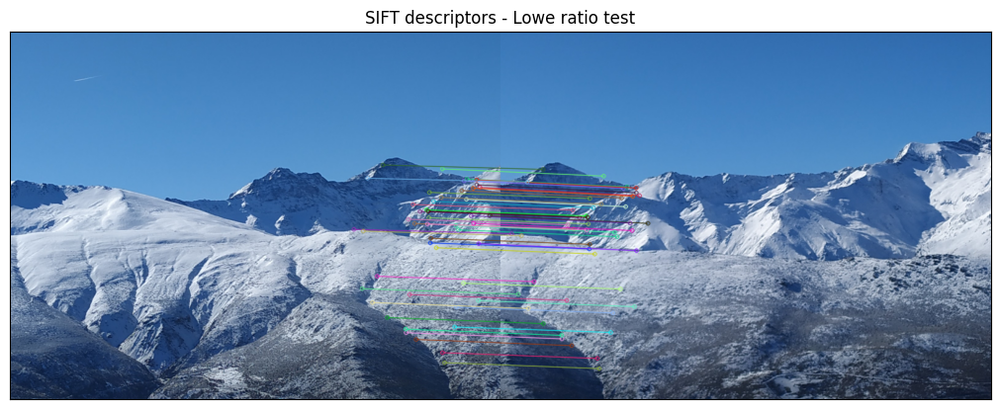

In [ ]:
# A CUBRIR POR EL ALUMNADO
# Brute Force
matches_BF = matching(ds1, ds2, 'BF')
showMatches(img1, kp1, img2, kp2, matches_BF, 50, 'SIFT descriptors - BF')

# Brute Force + Cross Check
matches_BFCC = matching(ds1, ds2, 'BF+CC')
showMatches(img1, kp1, img2, kp2, matches_BFCC, 50, 'SIFT descriptors - BF+CC')

# KNN + Lowe ratio test
matches_KNN = matching(ds1, ds2, 'KNN')  # ratio=0.75 por defecto
showMatches(img1, kp1, img2, kp2, matches_KNN, 50, 'SIFT descriptors - Lowe ratio test')



## <font color='blue'>Haralick Texture Features

Ahora, vamos a hacer lo mismo de antes, pero empleando las características de Haralick (del paquete `mahotas`: `mahotas.features.haralick`). Para ello debemos crear una pequeña ventana ($7\times7$ pixels) centrada en torno a los SIFT keypoints detectados, y calcular el vector de características correspondiente.



In [ ]:
!pip install mahotas

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 53.6 MB/s eta 0:00:00


<font color='blue'>Las características de Haralick son medidas estadísticas derivadas de la matriz de co-ocurrencia de niveles de gris (GLCM) que describen la textura de una imagen. La matriz guarda cuantas veces dos niveles de grises asyacentes entre ellos aparecen

<font color='blue'>Estas características se calculan a partir de imágenes en escala de grises y permiten extraer información sobre los patrones de textura presentes en la imagen.

<font color='blue'>El procedimiento es el siguiente, partimos de una imagen con valores de grises(por simplicidad asumimos que los valores posibles de gris son 1, 2 y 3), por ejemplo:

<font color='blue'>\begin{pmatrix}
1 & 1 & 2 & 1 \\
2 & 1 & 1 & 1 \\
3 & 2 & 3 & 1 \\
3 & 2 & 1 & 2
\end{pmatrix}

<font color='blue'>Ahora para cada pixel $i$, con valor $a$, que tenga adjacente un valor $b$, vamos rellenando la siguiente matriz:

<font color='blue'>$$
\text{GLCM}\quad
\begin{array}{c ccc}
i \backslash j & 1 & 2 & 3 \\
1 & 3 & 2 & 0 \\
2 & 3 & 0 & 1 \\
3 & 1 & 2 & 0
\end{array}
$$

<font color='blue'>Esto por ejemplo quiere decir que la combinación de valores de grises $3$ y adjencente a él un $2$ aparece dos veces. Luego quedaria normalizar esta matriz donde en cada casilla tendriamos $p(i,j)$, la probabilidad de que un pixel con valor i se encuentre adjacente a un pixel con valor j, y de ella se sacarían 14 estadísticas, como por ejemplo:

<font color='blue'>\begin{equation}
Contrast: \sum_{ij}{p(i,j)(i-j)^2}
\end{equation}

<font color='blue'>Cuando nos referimos al valor adyacente, hay cuatro posibilidades para una imagen 2D, en horizontal, vertical y las dos diagonales, luego haciendolo para las 4, acabariamos con una matriz $4x14$, y por último, tomamos la media de estas direcciones para formar un vector final de 14 elementos, de esta manera, el vector de características es más robusto a cambios de rotaciones.

<font color='blue'>Robert m. Haralick propuso 14 medidas que se pueden extraer de la GLCM para cuantificar la textura .Estas características incluyen medidas como contraste, correlación, energía, entropía, homogeneidad y dissimilarity, que proporcionan información sobre la variabilidad de brillo, la relación entre píxeles vecinos y la uniformidad de la textura.

<font color='blue'>La función mahotas.features.haralick() en el paquete mahotas realiza este cálculo analizando la GLCM de una imagen.

<font color='blue'>Para ello lo que vamos a hacer es para cada keypoint obtenido con SIFT obtener su descriptor de características  de haralick, creando una pequeña ventana de 7x7 píxeles centrada en torno al keypoint y usar la función haralick() que acepta varios parámetros clave:

<font color='blue'>f: la imagen de entrada en escala de grises.

<font color='blue'>ignore_zeros: un parámetro opcional que indica si se deben ignorar los valores cero en la matriz de entrada (True) o considerarlos (False), útil para tratar el fondo como valor cero.

<font color='blue'>distance: la distancia entre píxeles para calcular la GLCM, con un valor predeterminado de 1.

<font color='blue'>compute_14th_feature: un parámetro opcional que indica si se debe calcular la 14ª característica (dissimilarity); por defecto es False.

<font color='blue'>return_mean: si se establece en True, la función devuelve el valor medio de las características calculadas en las 4 direcciones.

<font color='blue'>El número de características devueltas depende de la dimensión de la imagen y del valor de compute_14th_feature. Para imágenes 2D, la función devuelve un vector de características de tamaño 4x13 o 4x14 (una fila por dirección), mientras que para imágenes 3D el tamaño es 13x13 o 13x14.

<font color='blue'>Nosotros al especificar return_mean, el resultado es un vector unidimensional.


In [ ]:
# A CUBRIR POR EL ALUMNADO
import mahotas
def haralick(im_gray, keypoints):
  descs = []
  kp_valid = []
  h, w = im_gray.shape
  for kp in keypoints:
    #La función round() garantiza que valores como 2.7 se conviertan en 3.0, y
    #luego int() convierte el resultado flotante en un tipo entero, eliminando
    # cualquier parte decimal.
    x = int(round(kp.pt[0]))
    y = int(round(kp.pt[1]))

    if x - 3 >= 0 and x + 3 < w and y - 3 >= 0 and y + 3 < h:
      # Extract 7x7 window centered on keypoint
      window = im_gray[y-3:y+4, x-3:x+4]
      # Compute Haralick features with mean across directions
      features = mahotas.features.haralick(window, return_mean=True)
      # features is now a 13-element vector
      descs.append(features)
      kp_valid.append(kp)

  descs = np.array(descs, dtype=np.float32) #Para las funciones de matching
  return kp_valid, descs

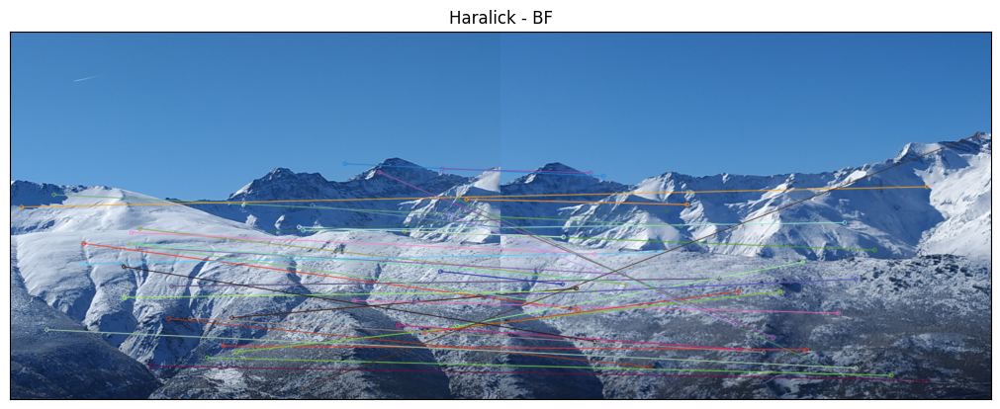

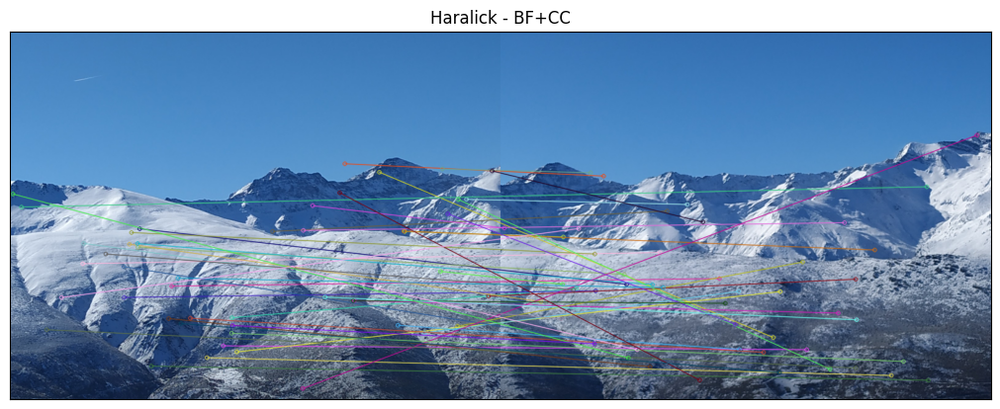

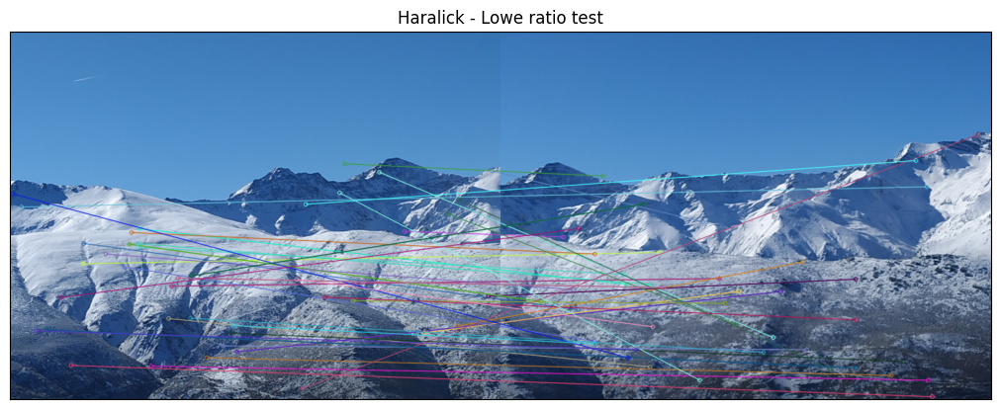

In [ ]:
# Descriptores Haralick usando los mismos keypoints SIFT
kp1_h, har1 = haralick(im1, kp1)
kp2_h, har2 = haralick(im2, kp2)

# Matching Haralick con los tres criterios
matches_H_BF   = matching(har1, har2, 'BF')
matches_H_BFCC = matching(har1, har2, 'BF+CC')
matches_H_KNN  = matching(har1, har2, 'KNN')

showMatches(img1, kp1_h, img2, kp2_h, matches_H_BF,   50, 'Haralick - BF')
showMatches(img1, kp1_h, img2, kp2_h, matches_H_BFCC, 50, 'Haralick - BF+CC')
showMatches(img1, kp1_h, img2, kp2_h, matches_H_KNN,  50, 'Haralick - Lowe ratio test')


## <font color='blue'>_Deep Features_

Ahora hacemos lo mismo, pero con _deep features_, es decir, características extraídas por medio de una red profunda. En concreto, el alumnado debe emplear ResNet50 preentrenada y, a la hora de aplicarla en inferencia sobre un _image patch_ (de tamaño $1.5$ veces el `kp.size` detectado por SIFT), quedarse con un vector de dimensionalidad $2048$ (dimensionalidad de salida tras el _global average pooling_ previo a la _fully connected layer_ con $1000$ unidades, debido a las $1000$ clases de ImageNet). El alumnado debe acordarse de ejecutar la GPU en este apartado. De lo contrario, la ejecución puede ser excesivamente lenta.

In [ ]:
# A CUBRIR POR EL ALUMNADO
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input

<font color='blue'>Para este apartado hemos usado el modelo ResNet50 preentrenado sin la capa totalmente conectada que tiene 1000 unidades. La función ResNet50 acepta varios argumentos para configurar el modelo:

<font color='blue'>include_top: Un valor booleano que indica si se debe incluir la capa totalmente conectada en la parte superior de la red. E nuestro caso lo hemos especicado como false.

<font color='blue'>weights: Especifica los pesos que se cargarán. Puede ser None (inicialización aleatoria), "imagenet" (preentrenado en ImageNet) o la ruta a un archivo de pesos.

<font color='blue'>input_tensor: Un tensor opcional de Keras que se utilizará como entrada de imagen para el modelo.

<font color='blue'>input_shape: Una tupla de forma opcional, requerida solo si include_top es False. La forma de entrada debe tener exactamente 3 canales, y el ancho y la altura no deben ser menores que 32.
Si include_top es True, la forma de entrada debe ser (224, 224, 3) (con formato de datos channels_last) o (3, 224, 224) (con formato channels_first).

<font color='blue'>pooling: Modo de pooling opcional para la extracción de características cuando include_top es False. Puede ser None (la salida es el tensor 4D del último bloque convolucional), 'avg' (se aplica global average pooling) o 'max' (se aplica global max pooling). En nuestro caso realizamos el global average pooling.

In [ ]:
resnet = ResNet50(weights='imagenet', include_top=False, pooling='avg')

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


<font color='blue'>Una vez que hemos creado el modelo, tenemos que aplicar la red en inferencia sobre un image patch (de tamaño  1.5  veces el kp.size detectado por SIFT). Todo con el objetivo de extraer un conjunto de 2048 características como descriptor del keypoint, y poder realizar el posterior matching centre las dos imágenes.

<font color='blue'>Para ello, para cada keypoint nos quedamos con el patch alrededor suya, si es factible, y pasamos a redimensionarlo y prepocesarlo, ya que, para aplicar ResNet50 en inferencia sobre un parche de imagen, primero hay que preprocesar el parche para que coincida con el tamaño de entrada esperado de 224x224 píxeles, normalizarlo usando la media y la desviación estándar de ImageNet, y convertirlo en un tensor en un formato adecuado para el modelo.

<font color='blue'>Con esto ya tendríamos las características de dicho keypoint. por último este vector de descriptores lo pasamos a un array de numpy, que es lo que va a recibir posteriormente *bf.match(ds1, ds2)*

In [ ]:
def deepDescriptors_resnet(img_color, kp):
  h, w, _ = img_color.shape #altura x anchura x canales
  descs = []
  kp_valid = []

  for point in kp:
    size = point.size * 1.5
    #La función round() garantiza que valores como 2.7 se conviertan en 3.0, y
    #luego int() convierte el resultado flotante en un tipo entero, eliminando
    # cualquier parte decimal.
    r = int(round(size / 2.0))

    x = int(round(point.pt[0]))
    y = int(round(point.pt[1]))

    if x - r >= 0 and x + r < w and y - r >= 0 and y + r < h:
      patch = img_color[y-r:y+r, x-r:x+r, :]
      if patch.size != 0:
        # Redimensionamos a 224x224
        patch_resized = cv2.resize(patch, (224, 224)).astype(np.float32)
        #Convertimos a tensor para hacerlo adecuado para el modelo
        #[HxWxC] --> [1xHxWxC], es decir, añadimos la dimensión del batch
        patch_resized = np.expand_dims(patch_resized, axis=0)
        #Aplicamos los pasos de prepocesamiento para replicar el formato de
        #entrada de ResNet50
        #La función espera una entrada en forma de un tensor por lotes con la
        #forma (batch_size, height, width, channels).
        patch_resized = preprocess_input(patch_resized)

        # Inferencia
        feature = resnet.predict(patch_resized, verbose=0)
        descs.append(feature[0])
        kp_valid.append(point)

  descs = np.array(descs, dtype=np.float32)
  return kp_valid, descs


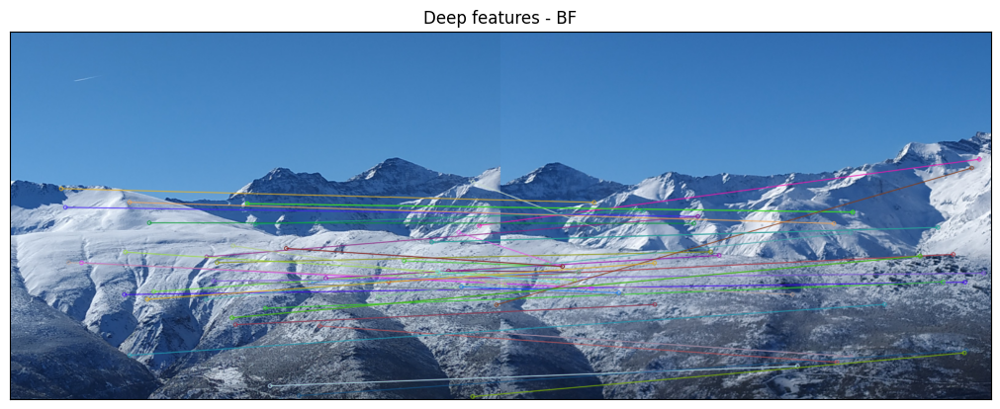

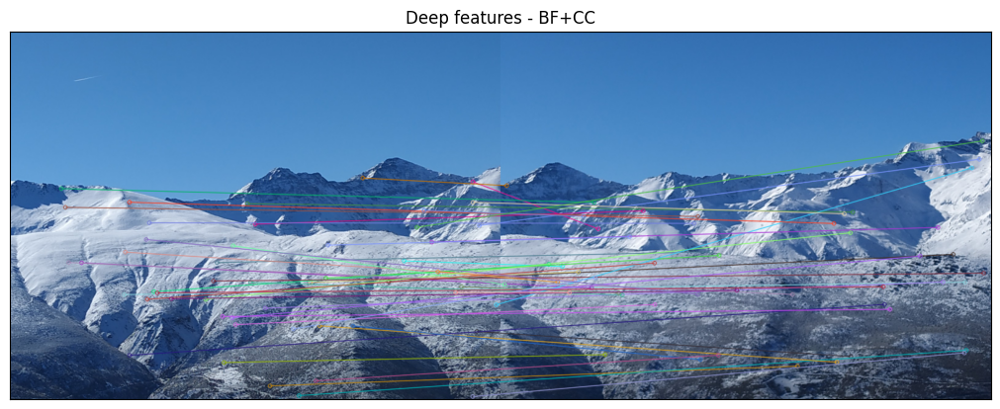

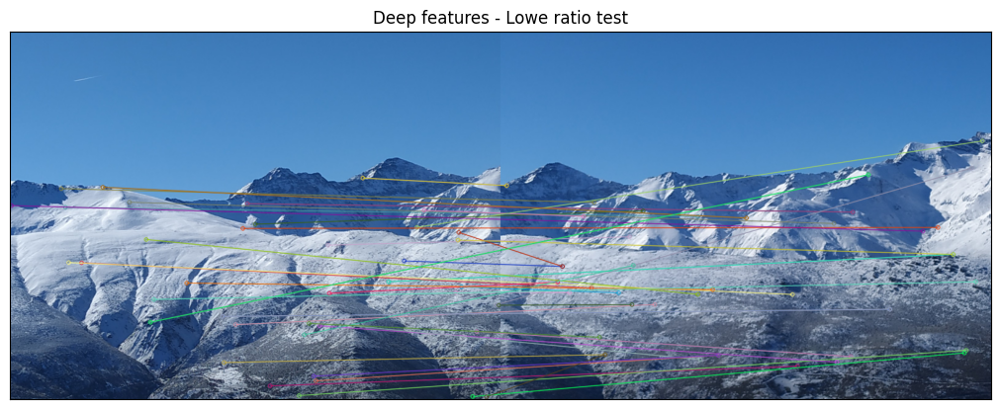

In [ ]:
# Descriptores deep features usando los mismos keypoints SIFT
kp1_d, df1 = deepDescriptors_resnet(img1, kp1)
kp2_d, df2 = deepDescriptors_resnet(img2, kp2)

# Matching con los tres criterios
matches_D_BF   = matching(df1, df2, 'BF')
matches_D_BFCC = matching(df1, df2, 'BF+CC')
matches_D_KNN  = matching(df1, df2, 'KNN')

showMatches(img1, kp1_d, img2, kp2_d, matches_D_BF,   50, 'Deep features - BF')
showMatches(img1, kp1_d, img2, kp2_d, matches_D_BFCC, 50, 'Deep features - BF+CC')
showMatches(img1, kp1_d, img2, kp2_d, matches_D_KNN,  50, 'Deep features - Lowe ratio test')

¿Cuál de los descriptores anteriores parece más adecuado para _keypoint matching_ y por qué?

<font color='blue'> Podemos ver que SIFT es claramente el descriptor más adecuado para el emparejamiento de keypoints. No solo viendo los resultados, donde ya vemos que tanto Harilick como usando Deep Features podemos ver que muchas líneas se cruzan claramente generando matches incorrectos y ambiguos, ya que no están captando bien la geometría de la imagen, si no que ya usando la teoriá podíamos saber que esto iba a pasar. Vamos a ir viendo las propiedades de cada uno para ver el porqué.

<font color='blue'>**1. SIFT**

<font color='blue'>Ese descriptor es invariante a escala, rotación y cambios moderados de iluminación:

- <font color='blue'>El punto se detecta en espacio de escala.

- <font color='blue'>El descriptor se construye en un sistema de referencia alineado con la orientación dominante del gradiente.

- <font color='blue'>Utiliza histogramas de gradiente (robustos al ruido y a pequeños desplazamientos).

- <font color='blue'>Además la dimensionalidad (128) es suficiente para ser descriptivo sin ser muy grande como pasa con DeepFeatures.

<font color='blue'>Como resultados podemos ver que obtenemos un porcentaje alto de correspondencias correctas y relativamente bien distribuidos por la escena.

<font color='blue'>**2. Haralick**

<font color='blue'>Los descriptores de Haralick se basan en la matriz de co-ocurrencia de niveles de gris (GLCM) en un parche, luego:

- <font color='blue'>Capturan textura estadística global del parche, no la estructura geométrica fina de la esquina.

- <font color='blue'>Solo tiene vectores de 13 valores, es decir, tiene muy poca capacidad para discriminar entre parches parecidos.

- <font color='blue'>No son invariantes a rotación ni a escala: rotar el mismo patrón cambia completamente la GLCM.

- <font color='blue'>Funcionan mejor para clasificar tipos de textura (madera, césped, ladrillo…) que para localizar el mismo punto exacto en otra vista.

<font color='blue'>Como resultados podemos ver que tiene muchos matches falsos en regiones con textura parecida y peor estabilidad cuando hay cambios de ilumincación, esto hace que sea el peor para la tarea.

<font color='blue'>**3. Deep Features (ResNet50)**

<font color='blue'>Las deep features de ResNet50 están pensadas para clasificación de imágenes completas:

- <font color='blue'>El vector de 2048 dimensiones tras el global average pooling captura contenido semántico global del parche (qué hay), no tanto la estructura local precisa (dónde está).

- <font color='blue'>Mucha invariancia a traslaciones y pequeñas deformaciones, pero no están diseñadas para ser estrictamente invariantes a rotación ni a cambios fuertes de escala.

- <font color='blue'>Al extraer un parche relativamente grande alrededor del keypoint y redimensionarlo a 224x224, el descriptor puede cambiar bastante si el keypoint se desplaza ligeramente.

- <font color='blue'>Aun así, suelen ser más robustas que Haralick a cambios de iluminación y ruido, y pueden funcionar razonablemente bien cuando el contenido semántico es muy parecido en ambas vistas.

<font color='blue'>Esto es algo que se puede ver en los resultados, que son claramente peores que SIFT, pero no hay tantos matches incorrectos como en Haralick.



---

<font color='blue'>**Comentario acerca de los tres criterios de emparejamiento**


<font color='blue'>*Brute Force (BF)*: Para cada descriptor de la imagen 1 busca el descriptor de la imagen 2 que tiene distancia mínima (L2), sin ningún filtro extra. En general vemos que obtiene muchos matches, pero no controla bien los falsos positivos.

  - <font color='blue'>SIFT: Se obtiene un número muy grande de correspondencias. Visualmente muchas líneas conectan zonas correctas de la montaña, pero también aparecen bastantes líneas cruzadas o claramente mal emparejadas.

  - <font color='blue'>Haralick: El número de matches también es muy alto, pero la calidad es peor. Muchas líneas unen regiones distintas que solo comparten una textura parecida (nieve/grava), así que hay bastantes falsos positivos.

  - <font color='blue'>Deep features: De nuevo obtenemos muchos matches. A nivel global las correspondencias tienen cierto sentido (zonas grandes de nieve o roca se emparejan entre sí), pero se ven bastantes líneas que saltan de una cresta a otra o entre laderas distintas.

<font color='blue'>*Brute Force con cross-check (BF+CC)*: Hace lo mismo que BF pero añade la condición de que el match tiene que ser coherente en los dos sentidos (A→B y B→A). Esto reduce el número de correspondencias y mejora un poco la calidad.

  - <font color='blue'>SIFT: Se eliminan varios emparejamientos claramente erróneos y las líneas se ven algo más ordenadas. Siguen existiendo matches cruzados, sobre todo en zonas de montaña muy repetitivas, pero en general la proporción de matches buenos aumenta respecto a BF.

  - <font color='blue'>Haralick: Baja un poco el número de correspondencias, pero la mejora visual no es tan grande. Siguen apareciendo muchos matches malos porque, aunque se cumpla la reciprocidad, los descriptores de Haralick no diferencian bien entre distintas zonas con la misma textura.

  - <font color='blue'>Deep features: El cross-check elimina algunos emparejamientos claramente inconsistentes y el resultado es algo más limpio que con BF.

<font color='blue'>*Lowe's ratio test (KNN)*: Aquí, para cada descriptor, se buscan los dos vecinos más cercanos y se calcula el cociente entre la distancia al mejor y al segundo mejor. Solo se aceptan los matches si este ratio es suficientemente pequeño (por ejemplo 0.75), es decir, si el mejor es claramente mejor que el segundo.

  - <font color='blue'>SIFT: El número de matches disminuye bastante, pero los que se mantienen son mucho más fiables. Las líneas suelen seguir bien la geometría de la montaña y hay menos cruces evidentes.

  - <font color='blue'>Haralick: El ratio test elimina muchos matches ambiguos, así que el dibujo es algo menos caótico que con BF y BF+CC. Aun así, todavía quedan bastantes líneas incorrectas.

  - <font color='blue'>Deep features: También se ve una reducción notable de matches, y los que sobreviven suelen ser algo más coherentes. Sin embargo, sigue habiendo emparejamientos que conectan zonas de montaña que no coinciden exactamente. Esto confirma que las deep features ayudan, pero no están tan pensadas para matching local como SIFT.

<font color='blue'>**En resumen**, vemos que BF es el más sencillo pero muy ruidoso, BF+CC filtra algo de ruido exigiendo reciprocidad, y el Lowe's ratio test es el que mejor controla los falsos positivos, sobre todo cuando se combina con descriptores SIFT, que son los más adecuados para esta tarea de emparejamiento de puntos de interés.

# <font color='blue'>**Ejercicio 3:** Creación de panoramas/mosaicos (_Image Stitching_) empleando homografías (4 puntos)

Ahora vamos a calcular homografías entre imágenes y usarlas para construir un mosaico/panorama. Para calcular la homografía entre dos imágenes, hay que llamar a la función `cv2.findHomography()`, que toma como entrada las listas de _keypoints_ y los matches/emparejamientos encontrados. Se debe usar RANSAC para realizar una estimación robusta.

<font color='blue'>Para este último ejercicio, vamos a combinar varias imágenes, que se solapan parcialmente para dar lugar a un **panorama**. Para ello vamos a tener que coger dos imáganes(o coger varias de dos en dos), detectar sus keypoints, encontrar los matches, y usarlos para alinear ambas imágenes.

<font color='blue'>Para que el proceso se haga correctamente, tenemos que tener un buen detector de keypoints, que sea invariante a diferencias geométricas y fotométricas y además necesitamos  estimar la transformación entre imágenes, a pesar de las correspondencias erróneas.

<font color='blue'>La creación de panoramas va a seguir el siguiente **algoritmo**:

1. <font color='blue'>Detectar puntos claves

2. <font color='blue'>Encontrar los matches entre ellos

3. <font color='blue'>Estimar la homografía con 4 puntos que se corresponden, aunque en general tenemos muchos más matches(y usar RANSAC para lidiar con outliers)

4. <font color='blue'>Projectar a una superficie y combinar.

<font color='blue'>Pero, ¿Qué es una **homografía**?

<font color='blue'>Una homografía, es una transformación, una matrix 3x3, que permite un mapeo de puntos de una imagen a otra, también se conoce como transformaciones projectivas y dado una serie de keypoints de ambas imágenes que hacen match, cada uno nos da la siguiente ecuación:

<font color='blue'>$$
\begin{bmatrix}
x'_i\\
y'_i\\
1
\end{bmatrix}
\simeq
\begin{bmatrix}
h_{00} & h_{01} & h_{02}\\
h_{10} & h_{11} & h_{12}\\
h_{20} & h_{21} & h_{22}
\end{bmatrix}
\begin{bmatrix}
x_i\\
y_i\\
1
\end{bmatrix}
$$

<font color='blue'>De la cual, convirtiendo desde coordenadas homogéneas y obtienendo un sistema igualado a cero obtenemos que cada par de puntos nos da la siguiente ecuación(Direct Linear Trasnformation):

<font color='blue'>$$
\begin{bmatrix}
x_i & y_i & 1 & 0 & 0 & 0 & -x'_i x_i & -x'_i y_i & -x'_i\\
0 & 0 & 0 & x_i & y_i & 1 & -y'_i x_i & -y'_i y_i & -y'_i
\end{bmatrix}
\begin{bmatrix}
h_{00}\\
h_{01}\\
h_{02}\\
h_{10}\\
h_{11}\\
h_{12}\\
h_{20}\\
h_{21}\\
h_{22}
\end{bmatrix}
=
\begin{bmatrix}
0\\
0
\end{bmatrix}
$$

<font color='blue'>La cual, si cogemos n matches, define un problema de mínimos cuadrados, $min_h||Ah||^2$ tal que $||h||^2 = 1$ que es un problema de autovalores.

<font color='blue'>Vamos a usar la función **cv2.findHomography** que calcula una matriz de homografía 3x3 que mapea puntos de una imagen a otra.

<font color='blue'>Hay que tener en cueta que para calcular una homografía se requieren al menos cuatro pares de puntos correspondientes entre las dos imágenes y se puede/debe usar RANSAC para realizar una estimación robusta.

<font color='blue'>Sintaxis básica

<font color='blue'>retval, mask = cv2.findHomography(

  <font color='blue'>  srcPoints, dstPoints, method,
    ransacReprojThreshold

<font color='blue'>)

<font color='blue'>srcPoints y dstPoints: Puntos correspondientes en la imagen origen y destino, respectivamente.

<font color='blue'>method: Especifica el algoritmo usado para calcular la homografía. Las opciones más comunes son:

<font color='blue'>cv2.RANSAC, cv2.LMEDS y cv2.RHO

<font color='blue'>ransacReprojThreshold: Cuando se usan métodos robustos como RANSAC, define el error máximo de reproyección permitido para que un par de puntos sea considerado un inlier. Normalmente se establece entre 1 y 10 píxeles.

<font color='blue'>La función devuelve:

<font color='blue'>retval: La matriz de homografía 3x3.

<font color='blue'>mask (opcional): Una máscara que indica el estado de inlier o outlier de cada correspondencia.

<font color='blue'>La matriz de homografía resultante puede utilizarse posteriormente con cv2.warpPerspective para transformar una imagen y alinearla con otra basándose en la homografía calculada.

<font color='blue'>Es importante tener en cuenta que tanto srcPoints como dstPoints están formateados como floating-points arrays, luego tenemos que hacer eso primero con los keypoints de ambas imágenes antes de pasarselos a cv2.findHomography, en caso contrario nos saltará el siguiente error: *srcPoints is not a numerical tuple*

---

<font color='blue'>**Breve explicación de RANSAC**

<font color='blue'>RANSAC sirve para ajustar un modelo (por ejemplo, una recta o una homografía) cuando los datos contienen muchos outliers y los mínimos cuadrados normales fallan.
La idea es elegir muchas veces, al azar, un subconjunto mínimo de puntos, ajustar con ellos un modelo y medir cuántos puntos totales quedan cerca de ese modelo (inliers).
El modelo que consiga más inliers se considera el mejor candidato.
Normalmente, al final se vuelve a ajustar el modelo usando solo esos inliers para refinarlo.
Así se obtiene una estimación robusta del modelo aunque haya bastantes correspondencias incorrectas o puntos ruidosos.

In [ ]:
# Esta función calcula la homografía entre dos imágenes.
def homography(kp1,kp2,matches, Ransac_Error,MIN_MATCH_COUNT):
  if len(matches)>MIN_MATCH_COUNT:
    # A CUBRIR POR EL ALUMNADO
    #kp1[m.queryIdx].pt y kp2[m.trainIdx].pt recuperan las coordenadas (x, y) de
    # los puntos clave, que luego se convierten en un arreglo de tipo float32 y
    #se reorganizan en el formato requerido (-1, 1, 2) para cv2.findHomography.
    srcPoints = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1,1,2)
    dstPoints = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1,1,2)
    H, mask = cv2.findHomography(
        srcPoints,
        dstPoints,
        method = cv2.RANSAC,
        ransacReprojThreshold = Ransac_Error
    )
  else:
     print('Error - very few matches')
  return H

Para componer el mosaico necesitamos realizar los siguientes pasos:

> a) Escoger un tamaño máximo para el lienzo/canvas/fondo sobre el que vamos a pegar y "encajar" todas las imágenes (tamaño que depende del número de imágenes a unir/componer y sus dimensiones).

> b) Escoger la imagen central que dará los ejes al mosaico (que debemos escoger con criterio, de cara a mejorar la calidad final del mosaico).

> c) Establecer el orden de cada imagen respecto a la central (es decir, podemos asumir que, a priori, conocemos la posición de cada imagen en la serie de imágenes tomadas y, como consecuencia, conocemos qué imágenes están a la derecha y/o a la izquierda de otras; en otras palabras, conocemos el orden en que fueron tomadas las fotografías en el movimiento de izquierda a derecha sacando la panorámica).

> d) Calculamos la homografía para copiar la imagen central en el lienzo (que es solamente una traslación).

> e) A continuación, debemos ir leyendo las imágenes de izquierda a derecha (recordemos que asumimos que conocemos el orden de adquisición de las imágenes), y debemos calcular la homografía entre cada par de imágenes consecutivas.

> f) Con la información anterior, debemos componer la homografía entre cada imagen y el lienzo/canvas. Es decir, la matriz que lleva cada imagen/foto a su posición correcta en el lienzo.

> g) Ahora, debemos utilizar las homografías calculadas para transportar las imágenes al lienzo (por medio de la función `cv2.warpPerspective()`). Es importante ir de fuera hacia dentro, es decir, desde los extremos hasta el centro, pegando en último término la imagen central, que es la que presentará un menor grado de deformación (porque la única transformación que se le aplicará será una pura traslación).

> i) Finalmente, debemos eliminar las regiones negras de los bordes del canvas para mejorar la calidad final del mosaico.

Se deben componer dos mosaicos:

- uno, relativo a fotografías tomadas desde la ETSIIT (imágenes `mosaico002.jpg`,`mosaico003.jpg`,`mosaico004.jpg`,`mosaico005.jpg`,`mosaico006.jpg`,
           `mosaico007.jpg`,`mosaico008.jpg`,`mosaico009.jpg`,`mosaico010.jpg`,`mosaico011.jpg`).

- otro, empleando las fotografías del Hall (imágenes `Picture1.jpg`,`Picture2.jpg`,`Picture3.jpg`,`Picture4.jpg`,`Picture5.jpg`,`Picture6.jpg`,`Picture7.jpg`,`Picture8.jpg`).

Se debe mostrar la composición, paso a paso, del canvas, es decir, el canvas a medida que se le van incorporando cada una de las imágenes, así como la composición final del mosaico (incluyendo una explicación relativa a si alguno de los dos mosaicos es más difícil de componer que el otro y por qué). Finalmente, se debe comparar el resultado de nuestra composición manual con el _stitcher_ de OpenCV: `cv2.Stitcher()`.

Al igual que en todas las demás entregas y ejercicios, resulta fundamental documentar el trabajo realizado, y explicar pausadamente todas las etapas implementadas (qué se ha hecho, cómo se ha hecho, y por qué se ha hecho así).


<font color='blue'>Una vez realizada lo función que calcula la homografía entre dos imágenes, la vamos a usar de manera iterativa sobre un conjunto de imágenes, de tal manera que, para cada par de imágenes consecutivas:

- <font color='blue'> Usamos SIFT para detectar keypoints y descriptores en ambas.

- <font color='blue'> Calculamos matches entre sus descriptores.

- <font color='blue'>Estimamos la homografía que lleva puntos de la imagen item a la imagen item+1.

<font color='blue'>Es decir, dadas N imágenes, la lista H tendrá longitud N-1:

- <font color='blue'>H[0]: homografía de 0 a 1

- <font color='blue'>H[1]: homografía de 1 a 2

- <font color='blue'>H[2]: homografía de 2 a 3

- <font color='blue'>…

<font color='blue'>Esta metodología queda realizada por la función *computeLocalHomographies*.

<font color='blue'>Posteriormente, en *mosaicHomographies* vamos a realizar lo siguiente. Lo que queremos al final es proyectar todas las imágenes que quremos al mosaico, luego necesitamos para cada imagen $i$ una homografía que la lleve a un mismo sistema de referencia común, este sistema de referencia lo vamos a tomar como la imagen central, la que nos da el índice idx.

<font color='blue'>Luego lo que queremos es una matriz $Hg[i]$ que lleve la imagen $i$ a la la imagen central (idx). Luego aplicaremos una traslación para colocar la central en el centro del canvas.

<font color='blue'>Ahora bien, ¿cómo hacemos esto? Lo que tenemos son las matrices $H[0]$ que nos lleva de la imagen 0 a la 1, $H[1]$ que nos lleva de la 1 a la 2 y así...

<font color='blue'>Luego, suponiendo por ejemplo que la imagen central es la 5, i.e. $idx=5$, la homografía de 2 a 5 es $H_{2->5} = H[4]H[3]H[2]$.

<font color='blue'>Hay que diferenciar dos casos:

- <font color='blue'>Lado izquierdo de la central: partimos de la central y vamos hacia la izquierda
  - <font color='blue'>$Hg[idx] = I$
  - <font color='blue'>$Hg[idx-1] = Hg[idx]H[idx-1] = IH[idx-1]$
  - <font color='blue'>$Hg[idx-2] = Hg[idx-1]H[idx-2] = IH[idx-1]H[idx-2]$
  - <font color='blue'> ...

- <font color='blue'>Lado derecho de la central: partimos de la central y vamos hacia la derecha. Como lo que tenemos es la lista H como parámetro de *mosaicHomographies*, esta lista siempre va de la imagen $i$ a la imagen $i+1$, luego por ejemplo para $i=7$ con $idx=5$ sabemos $H[5]$: 5->6 y $H[6]$: 6->7 y $H_{7->5} = H[5]^{-1}H[6]^{-1}$. Luego el algoritmo sería:
  - <font color='blue'>$Hg[idx+1] = Hg[idx]H[idx]^{-1} = IH[idx]^{-1}$
  - <font color='blue'>$Hg[idx+2] = Hg[idx+1]H[idx+1]^{-1} = IH[idx]^{-1}H[idx+1]^{-1}$
  - <font color='blue'> ...

<font color='blue'>De esta manera obtenemos para todos los $i$ un matriz $Hg[i]$ que lleva la imagen $i-ésima$ a la imagen central.

In [ ]:
# Esta función calcula las homografías entre cada par de imágenes consecutivas.
# Internamente llama a homography().
def computeLocalHomographies(images,method='KNN', Ransac_Error=5.0,Min_Match_Count=25):
  H=[]
  for item in range(0,len(images)-1):
    # A CUBRIR POR EL ALUMNADO
    kp1, ds1 = siftPoints(images[item],nfeatures=5000)
    kp2, ds2 = siftPoints(images[item+1],nfeatures=5000)
    matches = matching(ds1, ds2, method)
    Haux = homography(kp1,kp2,matches, Ransac_Error,Min_Match_Count)
    H.append(Haux)
  return H

# Esta función calcula/compone la homografía para trasladar cada imagen al canvas.
# idx sería el índice de la imagen central
def mosaicHomographies(H,idx):
  # A CUBRIR POR EL ALUMNADO
  n = len(H)+1
  Hg = [None] * n      # Hg[i] = homografía que lleva imagen i -> imagen central

  # La homografía que va de la central a la central es la identidad
  Hg[idx] = np.eye(3)

  # Lado izquierdo
  for i in range(idx-1, -1, -1):
    Hg[i] = Hg[i+1] @ H[i] #operador @ en NumPy es equivalente a np.dot(A,B

  # Lado derecho
  for i in range(idx+1, n):
    Hg[i] = Hg[i-1] @ np.linalg.inv(H[i-1])

  return Hg    # lista de longitud N

# Esta función fija la homografía para trasladar la imagen central al canvas.
def axesHomography(sizeim,sizecanvas):
  H=np.eye(3)
  H[0,2]=sizecanvas[1]//2-sizeim[1]//2
  H[1,2]=sizecanvas[0]//2-sizeim[0]//2
  return H

<font color='blue'>Ya tenemos:

- <font color='blue'>$images[i]$: La i-ésima foto
- <font color='blue'>$Hg[i]$: una homografía de la imagen $i$ a la imagen central
- <font color='blue'>$H0$: una traslación que coloca la imagen central en el centro del canvas.

<font color='blue'>Luego la homografía que lleva la imagen $i$ al canvas es $H_{canavas,i} = H_0H_g[i]$.

<font color='blue'>La función *composeMosaic* usa *cv2.warpPerpesctive* para aplicar la homografía y poner la imagen en el canvas. El borderMode=cv2.BORDER_TRANSPARENT hace que los píxeles negros (0) de la imagen transformada no tapen lo que ya hubiera en el canvas.

<font color='blue'>Se rellena el canvas de la siguiente manera:

1. <font color='blue'>Primero con las imágenes del lado izquierdo, desde la más externa hasta la que está junto a la central.

2. <font color='blue'>Luego con las del lado derecho, desde la más externa hacia la central.

3. <font color='blue'>Por último, la imagen central, que es la que menos deformación acumula.

<font color='blue'>El orden “de fuera hacia dentro” es para que las imágenes más importantes (las centrales, menos deformadas) se “pinten encima” y se vean mejor.

In [ ]:
# Esta función define el canvas.
def setCanvas(row,col,flagColor,nim=2):
  rows=row*nim//2
  cols=col*nim
  if flagColor==3:
    return np.zeros((rows,cols,3), np.uint8)
  else:
    return np.zeros((rows,cols), np.uint8)

# Esta función elimina píxeles redundantes/innecesarios del canvas.
def blackOut(img, offset=0):
  if len(img.shape)==3:
    im =cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    mask = np.array((im > 0), np.uint8)
    x,y,w,h=cv2.boundingRect(mask)
    return img[y+offset:y+h-offset,x+offset:x+w-offset,:]
  else:
    mask = np.array((img > 0), np.uint8)
    x,y,w,h=cv2.boundingRect(mask)
    return img[y+offset:y+h-offset,x+offset:x+w-offset]

# Esta función es la que compone el mosaico. Recibe como entrada:
# * images: lista de imágenes a componer;
# * canvas: generado a través de la aplicación de setCanvas();
# * H: lista de homografías, obtenidas por medio de computeLocalHomographies() y mosaicHomographies();
# * idx: índice de la imagen central;
# * H0: homografía que representa la traslación de la imagen central al canvas (obtenida por medio de axesHomography())
def composeMosaic(images,canvas,H,idxc,H0):
  # A CUBRIR POR EL ALUMNADO
  n = len(images)
  h_canvas, w_canvas = canvas.shape[:2]

  # 1) Lado izquierdo: de la imagen más a la izquierda hasta la que está justo antes de la central
  for i in range(0, idxc):
    Hi = H0 @ H[i]   # imagen i -> canvas
    canvas = cv2.warpPerspective(
        images[i],
        Hi,
        (w_canvas, h_canvas),
        dst=canvas,
        borderMode=cv2.BORDER_TRANSPARENT
    )
    displayIm(canvas, f'Canvas step (left) image {i}', 4)

  # 2) Lado derecho: de la imagen más a la derecha hacia la central
  for i in range(n-1, idxc, -1):
    Hi = H0 @ H[i]
    canvas = cv2.warpPerspective(
        images[i],
        Hi,
        (w_canvas, h_canvas),
        dst=canvas,
        borderMode=cv2.BORDER_TRANSPARENT
    )
    displayIm(canvas, f'Canvas step (right) image {i}', 4)

  # 3) Imagen central (la pegamos la última, solo traslación + pequeña corrección)
  Hc = H0 @ H[idxc]   # H[idxc] es la identidad, así que aquí básicamente es H0
  canvas = cv2.warpPerspective(
      images[idxc],
      Hc,
      (w_canvas, h_canvas),
      dst=canvas,
      borderMode=cv2.BORDER_TRANSPARENT
  )
  displayIm(canvas, 'Canvas after central image', 4)

  return canvas

## <font color='blue'> Mosaico ETSIIT

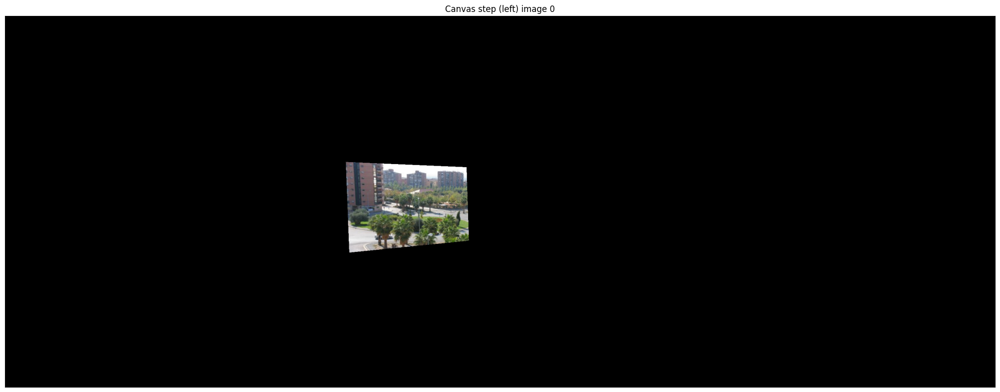

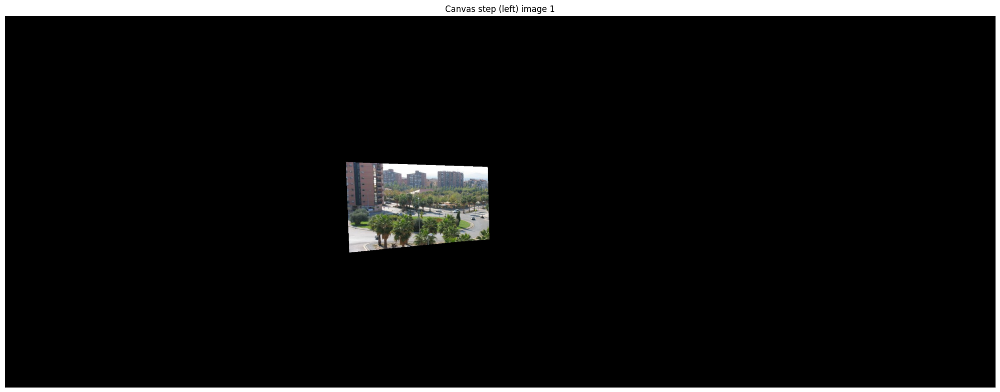

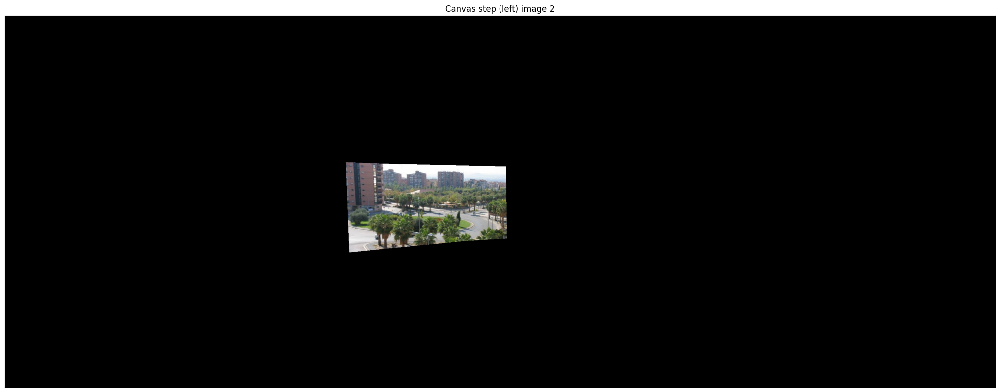

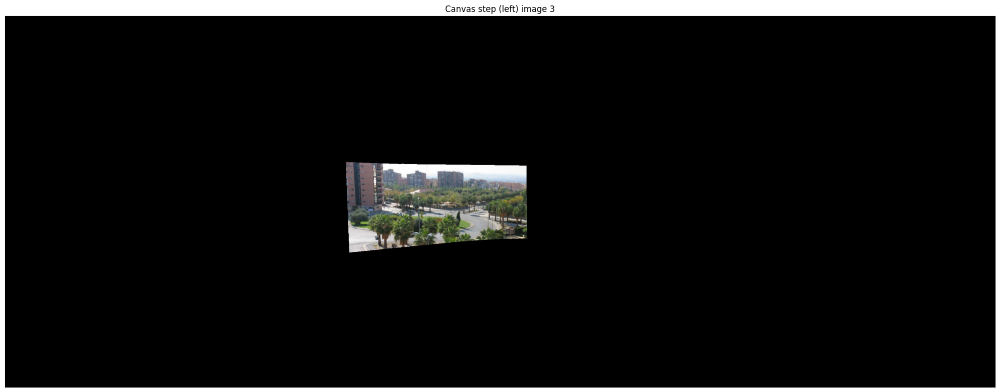

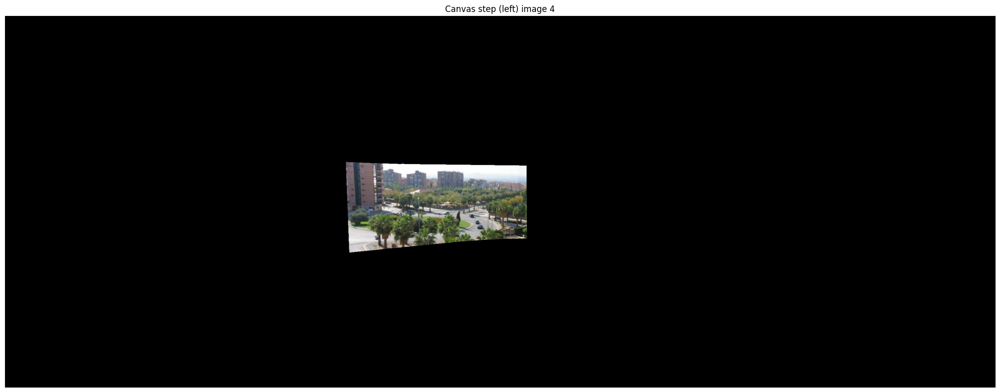

...

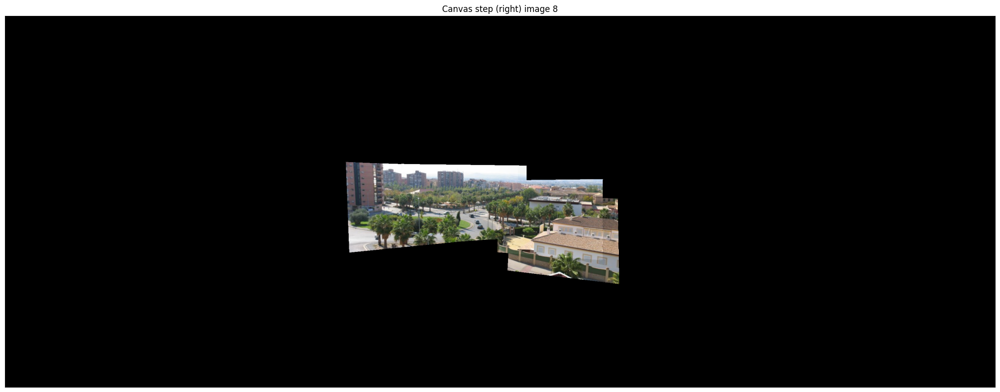

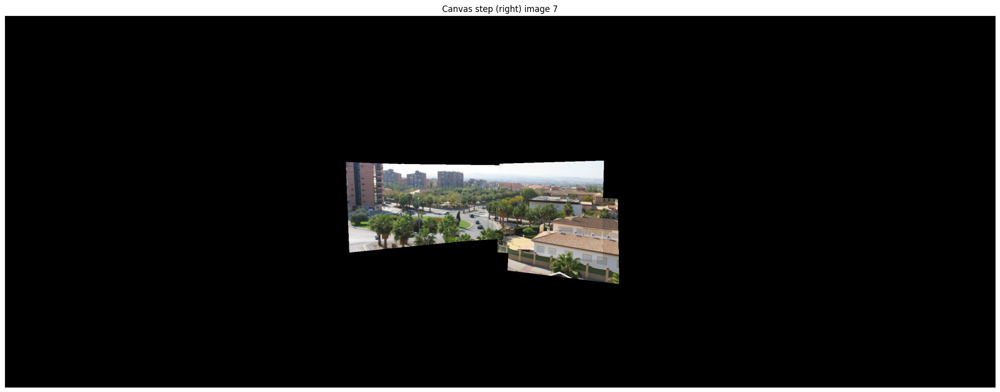

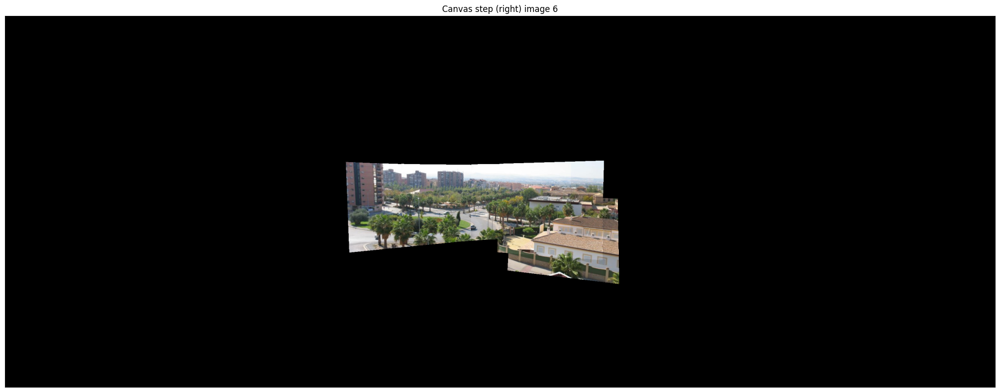

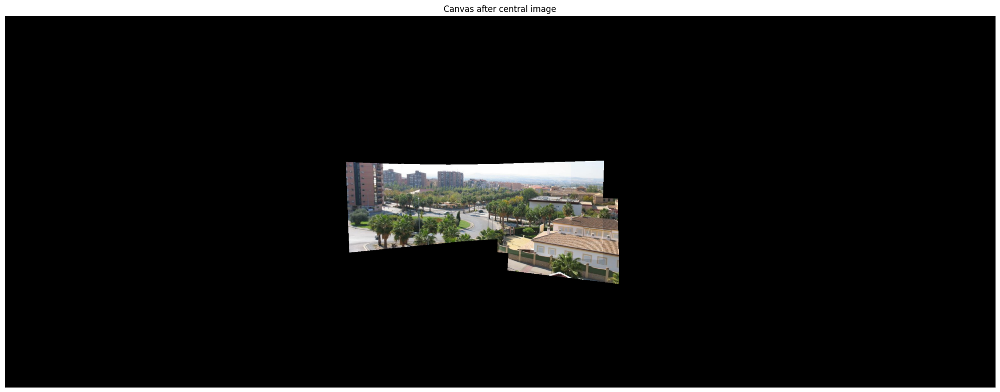

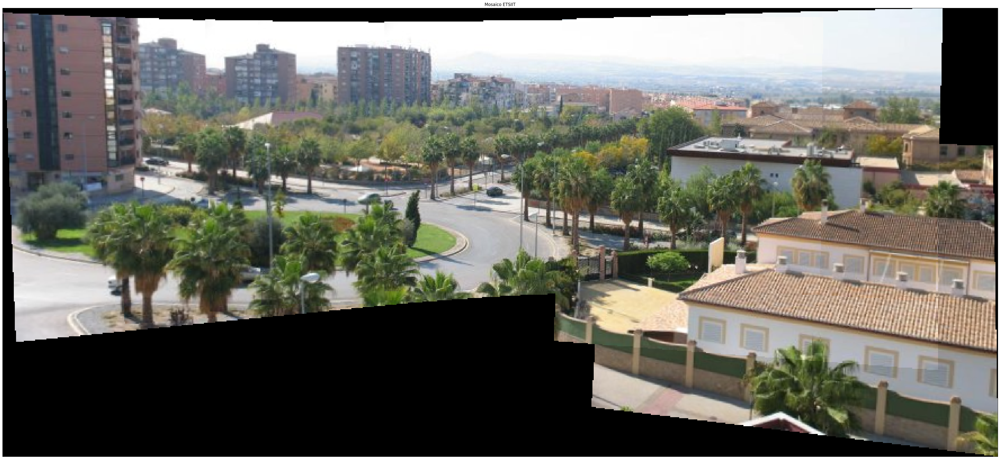

In [ ]:
images_etsiit=[]

#ETSIIT
PREFIX=''
nameImages_etsiit=['mosaico002.jpg','mosaico003.jpg','mosaico004.jpg','mosaico005.jpg','mosaico006.jpg',
           'mosaico007.jpg','mosaico008.jpg','mosaico009.jpg','mosaico010.jpg','mosaico011.jpg']

for item in nameImages_etsiit:
   images_etsiit.append(readIm(get_image(PREFIX+item),flagColor=1))

# A CUBRIR POR EL ALUMNADO
# Parámetros básicos
nim = len(images_etsiit)
rows, cols = images_etsiit[0].shape[0], images_etsiit[0].shape[1]

# Definimos el canvas (suficientemente grande)
canvas = setCanvas(rows, cols, flagColor=3, nim=nim)

# Elegimos índice de imagen central (por ejemplo, en la mitad de la secuencia)
idxc = nim // 2   # para 10 imágenes, idxc = 5  (mosaico007.jpg)

# 1) Homografías locales entre imágenes consecutivas
H_local = computeLocalHomographies(images_etsiit, method='KNN', Ransac_Error=5.0, Min_Match_Count=25)

# 2) Homografías imagen -> imagen central
H_global = mosaicHomographies(H_local, idxc)

# 3) Homografía de traslación de la central al centro del canvas
H0 = axesHomography(sizeim=images_etsiit[idxc].shape[:2], sizecanvas=canvas.shape[:2])

# 4) Composición del mosaico
mosaic = composeMosaic(images_etsiit, canvas, H_global, idxc, H0)
displayIm(blackOut(mosaic),'Mosaico ETSIIT',8)


<font color='blue'>En el caso del mosaico de la ETSIIT, el resultado de la composición manual es bastante razonable: la parte central del panorama (zona de la rotonda y los edificios del fondo) queda bien alineada y se percibe continuidad entre las distintas fotos. Se notan algunos pequeños saltos y desajustes en las zonas más cercanas (coches, palmeras, tejados de la derecha), y también aparecen bordes negros en la parte superior e inferior debido a las deformaciones de las homografías y al tamaño fijo del canvas. Aun así, visualmente el mosaico es coherente y se reconoce bien la escena completa.

<font color='blue'>Si lo relacionamos con la teoría, las homografías son una buena aproximación cuando: (1) capturamos imágenes de una escena 3D desde el mismo punto de vista (solo rotación de cámara), (2) la escena está muy lejos y se puede aproximar por un plano en el infinito, o (3) los puntos de la escena están aproximadamente en un mismo plano. En este caso, la mayor parte de la escena relevante (edificios lejanos, línea del horizonte) está bastante lejos, así que el modelo de homografía funciona relativamente bien.

## <font color='blue'> Mosaico Corridor

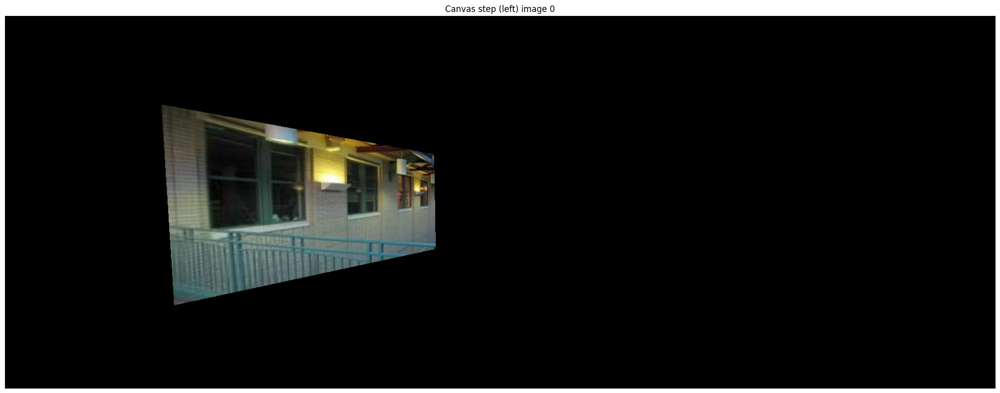

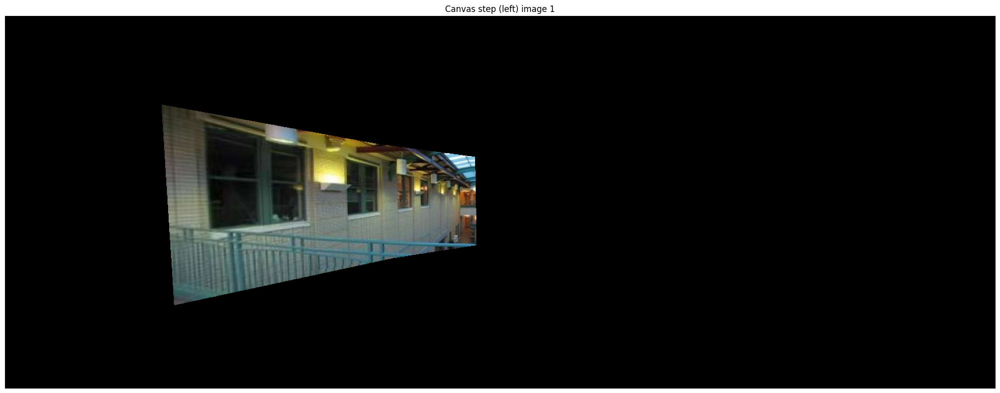

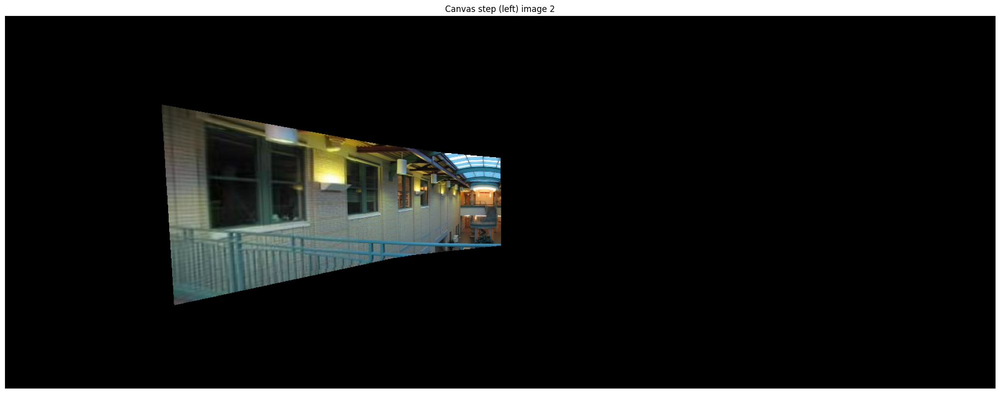

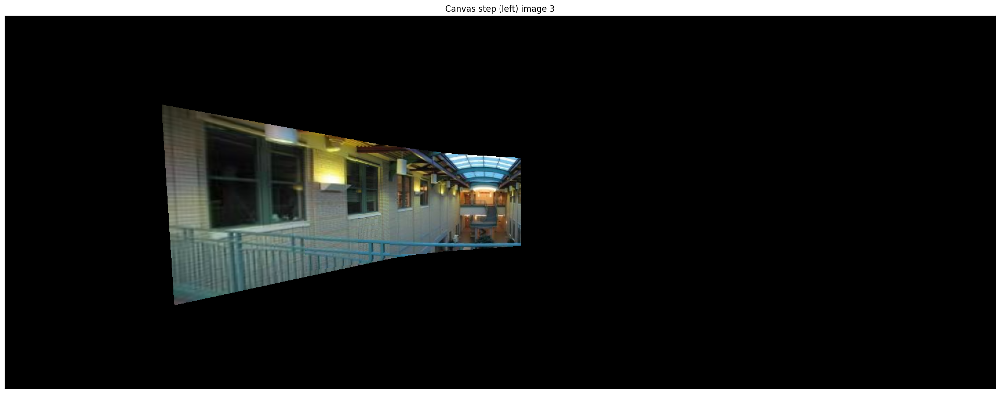

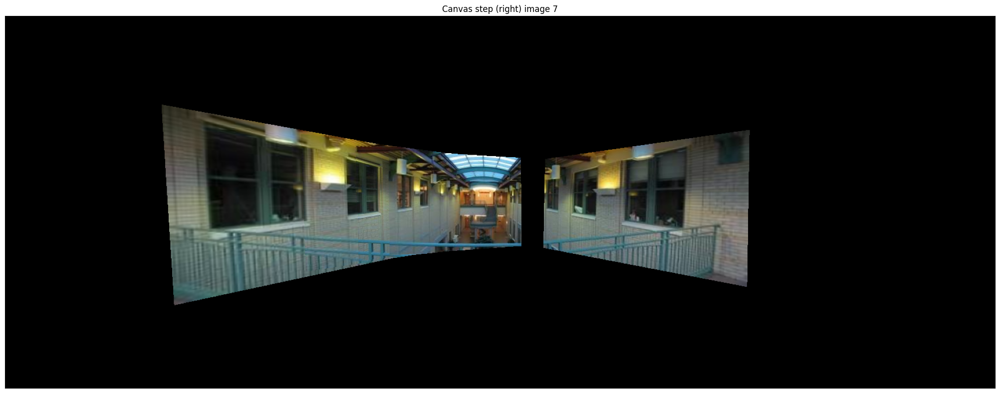

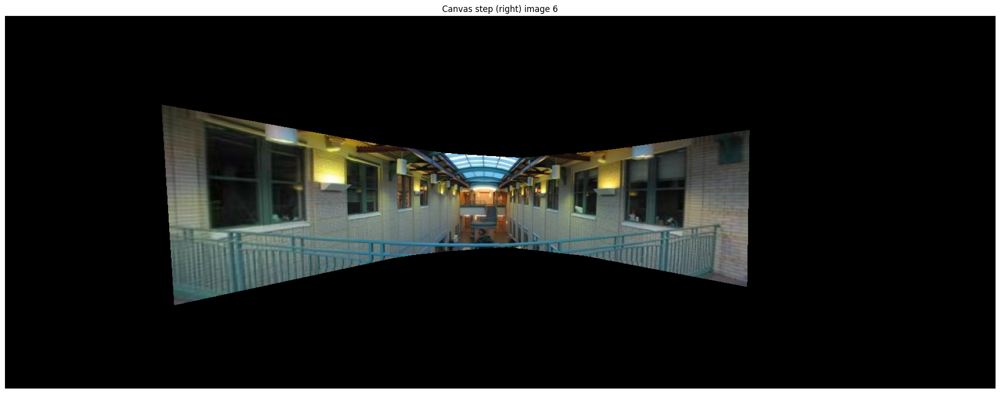

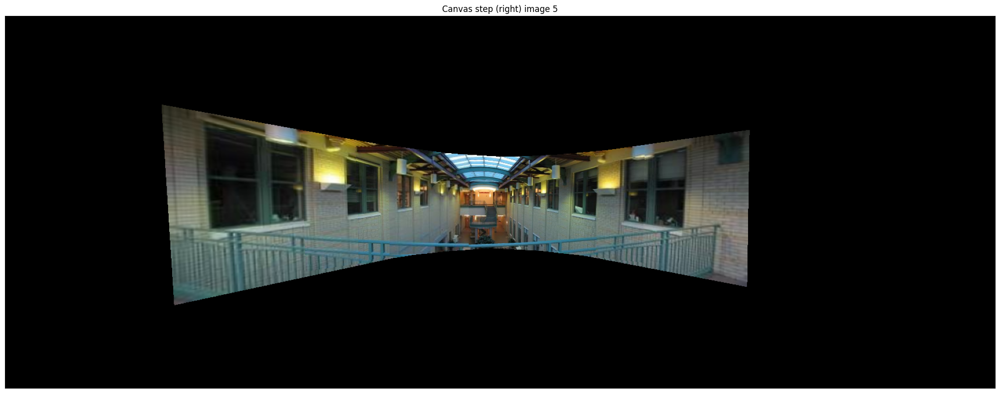

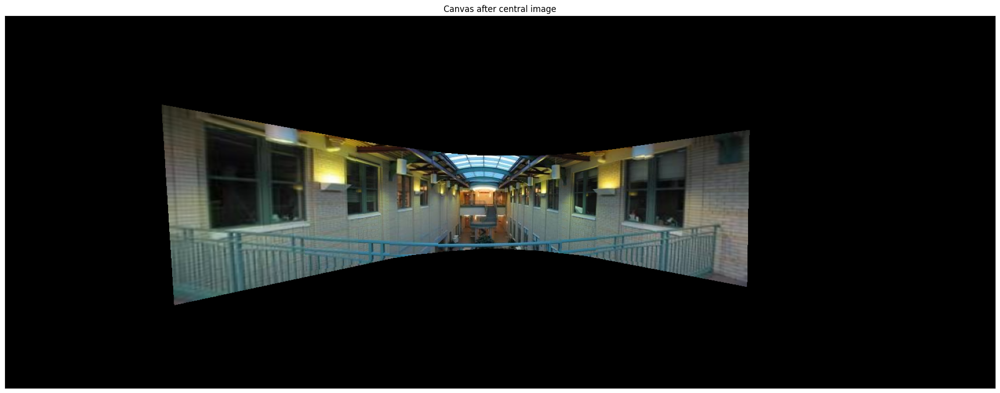

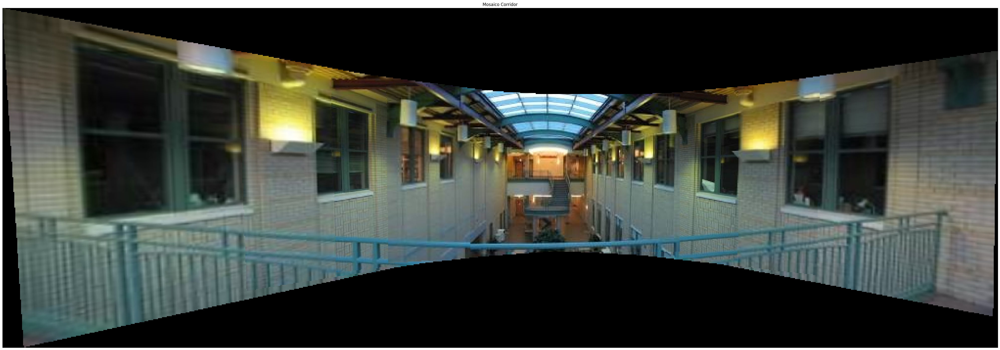

In [ ]:
images_corridor=[]
PREFIX='corridor/'
nameImages_corridor=['Picture1.jpg','Picture2.jpg','Picture3.jpg','Picture4.jpg','Picture5.jpg','Picture6.jpg','Picture7.jpg','Picture8.jpg']
for item in nameImages_corridor:
   images_corridor.append(readIm(get_image(PREFIX+item),flagColor=1))

# A CUBRIR POR EL ALUMNADO
nim = len(images_corridor)
rows, cols = images_corridor[0].shape[0], images_corridor[0].shape[1]

canvas = setCanvas(rows, cols, flagColor=3, nim=nim)

# Elegimos imagen central (por ejemplo, en la mitad)
idxc = nim // 2    # para 8 imágenes, idxc = 4 (Picture5.jpg)

# 1) Homografías locales
H_local = computeLocalHomographies(images_corridor, method='KNN', Ransac_Error=5.0, Min_Match_Count=25)

# 2) Homografías imagen -> imagen central
H_global = mosaicHomographies(H_local, idxc)

# 3) Traslación de la central al canvas
H0 = axesHomography(sizeim=images_corridor[idxc].shape[:2], sizecanvas=canvas.shape[:2])

# 4) Composición del mosaico
mosaic = composeMosaic(images_corridor, canvas, H_global, idxc, H0)

displayIm(blackOut(mosaic),'Mosaico Corridor',8)

<font color='blue'>En el mosaico del pasillo (corridor), la composición manual resulta más delicada. Aunque la escena también forma un panorama continuo, se aprecia una deformación mucho más marcada, especialmente en la barandilla y en las paredes laterales, que aparecen curvadas. Esto ocurre porque en el pasillo hay mucha estructura 3D en distintas profundidades (paredes laterales, pasarela, barandilla, techo de cristal, etc.) y seguramente la cámara no se ha mantenido exactamente en el mismo punto al tomar las fotos, y recordemos que las homografías son útiles cuando:

- <font color='blue'>Capturamos imágenes en una escena 3D, pero exactamente desde el mismo punto.
- <font color='blue'>La escena está muy lejos(plano en el infinito).
- <font color='blue'>Los puntos de la escena se encuentran en un plano.

<font color='blue'>Claramente la segunda y tercera opción no son las de este caso, y además es posible que no se haya cumplido la primera. Lo que explicaría que este mosaico sea más difícil de componer que el de la ETSIIT.

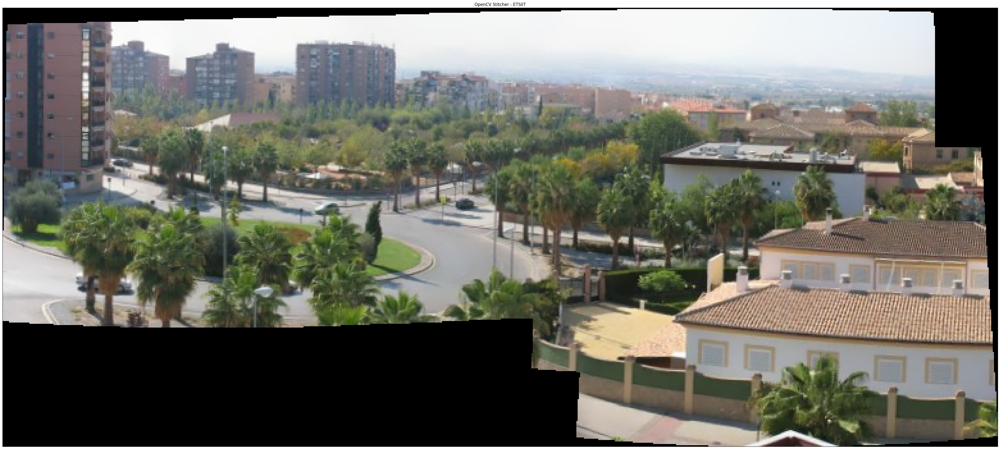

In [ ]:
# Comparación para ETSIIT
stitcher = cv2.Stitcher_create(cv2.Stitcher_PANORAMA)
(status, pano_etsiit) = stitcher.stitch(images_etsiit)

if status == cv2.Stitcher_OK:
    displayIm(pano_etsiit, 'OpenCV Stitcher - ETSIIT', 8)
else:
    print('Stitcher ETSIIT failed, status =', status)


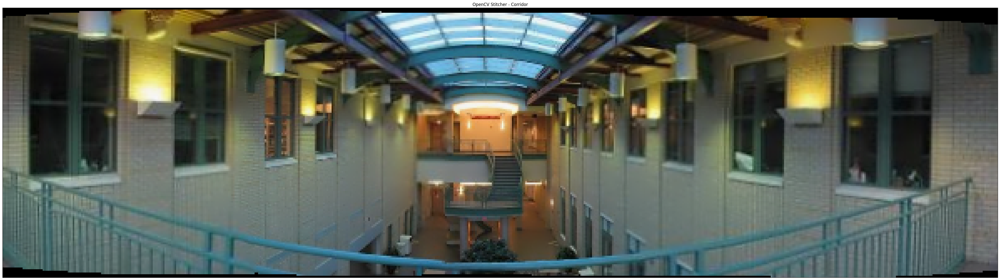

In [ ]:
# Comparación para corridor
stitcher = cv2.Stitcher_create(cv2.Stitcher_PANORAMA)
(status, pano_corridor) = stitcher.stitch(images_corridor)

if status == cv2.Stitcher_OK:
    displayIm(pano_corridor, 'OpenCV Stitcher - Corridor', 8)
else:
    print('Stitcher Corridor failed, status =', status)

<font color='blue'>**Comparando con el resultado de cv2.Stitcher()**, se ve que este suele producir panoramas más “limpios” y con transiciones menos visibles. El resultado de OpenCV es mejor que el nuestro, entre otros motivos, porque usa por defecto una proyección esférica, generalmente más adecuada para muchas de estas tareas. También vemos que trabaja el tema de difuminar, o hacer blending, de las costuras de la imagen (algo que nosotros no hacemos), así como compensar diferencias de iluminación en la escena, por lo que el acabado es mejor.  Esto se nota especialmente en el pasillo, donde el stitcher consigue un panorama con menos artefactos que el generado de forma manual con una homografía global fija.

---

<font color='blue'>**En resumen**, el mosaico de la ETSIIT es más sencillo de componer y se ajusta mejor a las hipótesis de homografía (escena más lejana y relativamente plana), mientras que el mosaico del corridor es claramente más difícil porque con una única homografía entre pares asumimos que todas las imágenes se relacionan por una transformación plana (o cámara que solo rota). Recordemos que una homografía asume que la escena es plana o que la cámara rota exactamente sobre su centro óptico (sin desplazarse; es decir, no hay traslación). En cambio, en un pasillo hay paralaje (profundidades muy distintas: barandilla cerca, paredes lejos) y, probablemente, también haya algo de traslación de la cámara. La homografía alinea bien el plano dominante (p.ej., paredes/techo), pero deforma lo que está a otra profundidad (p.ej., barandilla), y al componer varias H encadenadas el error se acumula. El stitcher de OpenCV mejora nuestros resultados manuales, sobre todo en el corridor, gracias a que combina una estimación más avanzada de las transformaciones con técnicas de mezcla de imágenes más sofisticadas.